In [1]:
import numpy as np
%matplotlib inline

from devito import configuration

configuration['log-level'] = 'WARNING'

In [2]:
import scipy.io as sio
from scipy import signal
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy.signal import convolve2d
from scipy.signal import correlate2d
from scipy.signal import fftconvolve
from scipy.signal import convolve
from scipy.signal import correlate
from copy import deepcopy

# Contoh membaca file .mat
#data = sio.loadmat("BG450_model.mat")
data = np.loadtxt('Model/Vp0 model DIX PSTM INV NMO Rev 1.txt')
#print(data.keys())
# Misalkan velocity model ada di key tertentu, misalnya 'velocity_model':
vp = data.T/1000
vp0 = np.loadtxt('Model/Vp0 model DIX PSTM INV NMO Rev 1.txt').T
vp0 = (vp0)/1000
vp0 = gaussian_filter(vp, [2, 2]) #velocity model intial


import numpy as np
from scipy.ndimage import zoom

# Misal velocity adalah array (nz, nx) dengan resolusi 10 meter
# Kita ingin menginterpolasi ke resolusi 2.5 meter
#vp0 = zoom(vp0, zoom=1, order=1)  # linear interpolation


waterheight = 36

vp0[:, :waterheight] = 1.5

vp1 = deepcopy(vp0)
vp1[1311, 263] = 4.5

print(np.min(vp1))
print(np.max(vp1))

vp0.shape

1.5
4.5


(1312, 264)

In [3]:
#NBVAL_IGNORE_OUTPUT
from examples.seismic import Model, plot_velocity, plot_perturbation, Receiver

# Define a physical size
shape = (vp0.shape)  # Number of grid point (nx, nz)
spacing = (12.5, 12.5)  # Grid spacing in m. The domain size is now 1km by 1km
origin = (0.,0.)  # What is the location of the top left corner. This is necessary to define
nboundary = 80


model0 = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
              space_order=8, nbl=nboundary, bcs="damp")

model1 = Model(vp=vp1, origin=origin, shape=shape, spacing=spacing,
              space_order=8, nbl=nboundary, bcs="damp", grid = model0.grid)

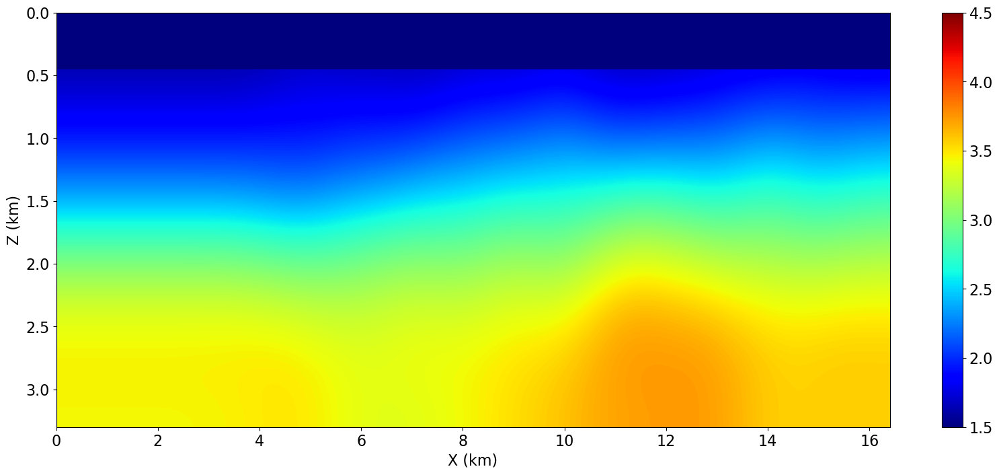

In [4]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=[20,8])
plt.imshow(model0.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

In [5]:
model1.vp.data.shape

(1472, 424)

In [6]:
def analisis_spektrum_source(source, dt):
    """
    Analisis spektrum frekuensi dari data source 1D.
    
    Parameters:
        source (np.ndarray): array 1D atau 2D (n_time, 1) dari source time signal
        dt (float): interval waktu (dalam detik)
    """
    # Jika source berdimensi (n_time, 1), ubah ke 1D
    if source.ndim == 2 and source.shape[1] == 1:
        source = source[:, 0]

    n = len(source)
    freq = np.fft.rfftfreq(n, d=dt)
    spectrum = np.abs(np.fft.rfft(source))

    # Frekuensi dominan
    f_dominan = freq[np.argmax(spectrum)]

    # Plot
    plt.figure(figsize=(8, 4))
    plt.plot(freq, spectrum, label='Spektrum')
    plt.axvline(f_dominan, color='r', linestyle='--', label=f'f_dominan = {f_dominan:.2f} Hz')
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Amplitudo')
    plt.title('Spektrum Frekuensi Source')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return f_dominan

    
def dominant_frequency(data, dt, plot=True):
    """
    Menghitung frekuensi dominan dari data seismik (n_time, n_receiver).
    
    Parameters:
    -----------
    data : 2D np.array
        Data seismik gather (n_time, n_receiver).
    dt : float
        Sampling interval dalam detik.
    plot : bool
        Jika True, tampilkan spektrum frekuensi rata-rata.

    Returns:
    --------
    f_dom : float
        Frekuensi dominan dalam Hz.
    f : np.array
        Array frekuensi.
    spectrum : np.array
        Rata-rata spektrum amplitudo.
    """
    n_time, _ = data.shape
    fs = 1.0 / dt  # frekuensi sampling
    f = np.fft.rfftfreq(n_time, d=dt)

    # FFT tiap trace dan ambil magnitudo, lalu rata-ratakan
    spectrum = np.abs(np.fft.rfft(data, axis=0))
    avg_spectrum = np.mean(spectrum, axis=1)

    # Ambil frekuensi dominan (frekuensi dengan amplitudo maksimum)
    f_dom = f[np.argmax(avg_spectrum)]

    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(f, avg_spectrum, label='Rata-rata Spektrum')
        plt.axvline(f_dom, color='r', linestyle='--', label=f'f_dominan = {f_dom:.2f} Hz')
        plt.xlabel('Frekuensi (Hz)')
        plt.ylabel('Amplitudo')
        plt.title('Spektrum Frekuensi Rata-rata dari Gather')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return f_dom, f, avg_spectrum

In [7]:
#NBVAL_IGNORE_OUTPUT
# Define acquisition geometry: source
from examples.seismic import AcquisitionGeometry, TimeAxis, RickerSource

#geometry define
#source geometry
nshots = 125  # Number of shots to create gradient from
shot_first_coordinate = 4050
shot_last_coordinate = 16450
shot_depth = 0

#receriver geometry
nreceivers = 160  # Number of receiver locations per shot 
first_channel_firstlreceriverline_coordinate = 0
last_channel_firstreceiverline_coordinate = 4050
receiverline_interval = 100
receiver_depth = 0



#recording define
dt = model1.critical_dt
t0 = 0.
tn = 4500. +2
timeAx = TimeAxis(start=t0, stop=tn, step=dt)


#source define
f0 = 0.013
shift_phase = 0


In [8]:
# First, position source centrally in all dimensions, then set depth
def geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, f0, shift_phase):
    src_coordinates = np.empty((nshots, 2))
    src_coordinates[:, 0] = np.linspace(shot_first_coordinate, shot_last_coordinate, nshots)
    src_coordinates[:, 1] = shot_depth  # Depth is 20m

    geometrys = []

    for i in range(nshots):
        # Define acquisition geometry: receivers

        # Initialize receivers for synthetic and imaging data
        rec_coordinates = np.empty((nreceivers, 2))
        rec_coordinates[:, 0] = np.linspace(first_channel_firstlreceriverline_coordinate+(i*receiverline_interval), last_channel_firstreceiverline_coordinate+(i*receiverline_interval), nreceivers)
        rec_coordinates[:, 1] = receiver_depth  # Depth is 20m

        # Geometry
        geometry = AcquisitionGeometry(model1, rec_coordinates, src_coordinates, t0, tn, f0=f0, src_type='Ricker', dt=dt)
        geometrys.append(geometry)


    t = np.arange(t0, tn+2, (dt))
    t = t/1000
    f0z = f0*1000
    t0 =   (1/f0z)
    st = (1 - (2*(np.pi**2)*(f0z**2)*(t-t0)**2))*(np.exp(-1*(np.pi**2)*(f0z**2)*(t-t0)**2))

    wavelet = st

    angle = shift_phase
    shifted = np.real(np.exp(1j*np.radians(angle)) * signal.hilbert(wavelet))
    shifted = np.array([shifted])
    shiftedT = shifted.T

    srcs = []

    for i in range(nshots):
        src = RickerSource(name='src', grid=model0.grid, f0=f0, time_range=timeAx)
        # First, position source centrally in all dimensions, then set depth
        src.coordinates.data[0, :] = src_coordinates[i, 0]
        src.coordinates.data[0, -1] = shot_depth  # Depth is 20m
        src.data[:] = shiftedT
        srcs.append(src)

    return geometrys, srcs

In [9]:
geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, f0, shift_phase)

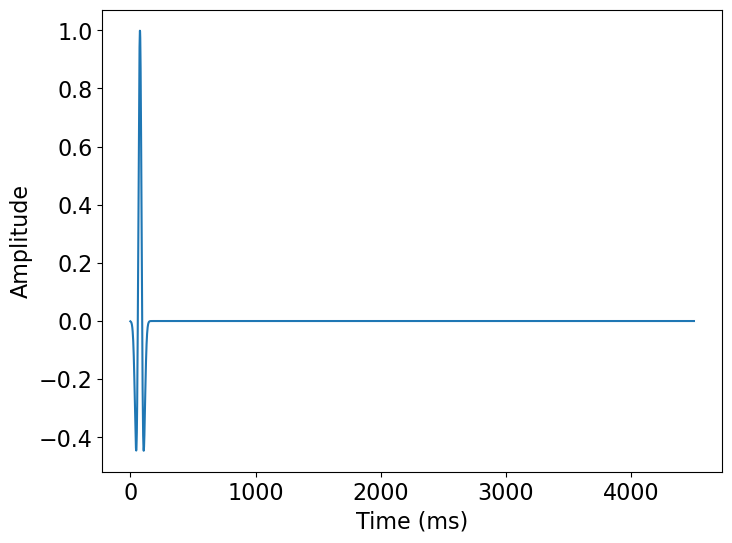

(3126, 1)
TimeAxis: start=0, stop=4503.12, step=1.441, num=3126


In [10]:
srcs[0].show()
print(srcs[0].data.shape)

print(geometrys[0])
print(geometrys[0].time_axis)

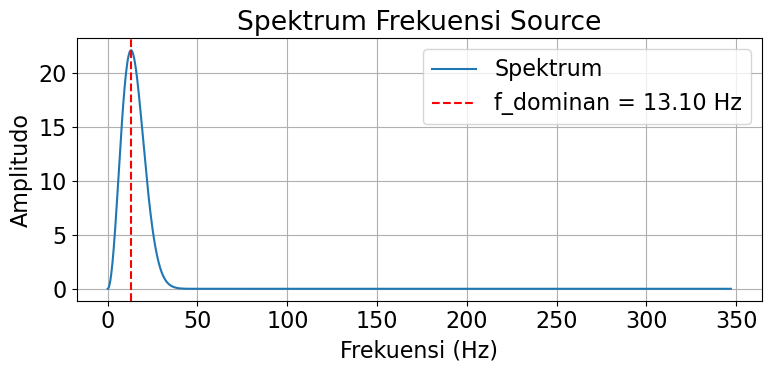

Frekuensi dominan: 13.10 Hz


In [11]:
f_dom = analisis_spektrum_source(srcs[0].data, dt=(dt/1000))
print(f"Frekuensi dominan: {f_dom:.2f} Hz")

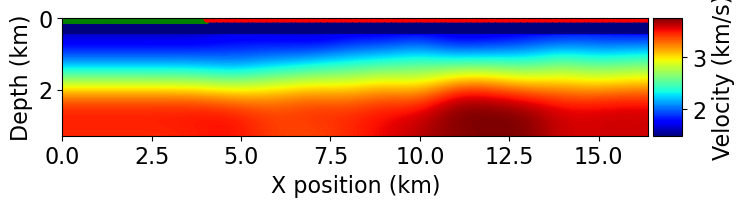

In [12]:
#NBVAL_IGNORE_OUTPUT
# Plot acquisition geometry
#plt.figure(figsize=[20,20])
plot_velocity(model0, source=geometrys[0].src_positions, receiver=geometrys[0].rec_positions)

In [13]:
# Mencari indeks geophone terdekat untuk setiap shot
geometry = geometrys[0]
nearest_indices = []
i=0
for shot in geometry.src_positions:
    distances = np.linalg.norm(geometrys[i].rec_positions - shot, axis=1)  # Hitung jarak Euclidean
    nearest_index = np.argmin(distances)  # Cari indeks dengan jarak minimum
    nearest_indices.append(nearest_index)
    i+=1

nearest_indices = np.array(nearest_indices)

nearest_indices -= 2

print(nearest_indices)

[158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158
 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158 158]


In [14]:
import segyio
import numpy as np
from collections import defaultdict

filename = '../MarmousiAcousticInvisibleSurface.sgy'

# Dictionary untuk menyimpan shot gathers
shot_data = defaultdict(list)

with segyio.open(filename, "r", ignore_geometry=True) as segyfile:
    segyfile.mmap()
    n_traces = segyfile.tracecount
    n_samples = segyfile.samples.size
    
    # Ambil ID field record (shot number) per trace
    shot_ids = segyfile.attributes(segyio.TraceField.FieldRecord)[:]
    
    # Kelompokkan trace per shot
    for i in range(n_traces):
        shot_id = shot_ids[i]
        trace = segyfile.trace[i]
        shot_data[shot_id].append(trace)

# Ubah list trace per shot menjadi array (samples x trace)
shot_gathers = []
for shot_id, traces in shot_data.items():
    gather = np.stack(traces).T  # shape: (samples, traces)
    shot_gathers.append(gather)

# Contoh: akses shot ke-0
first_shot = shot_gathers[0]
print("Shape of first shot:", first_shot.shape)


Shape of first shot: (1126, 160)


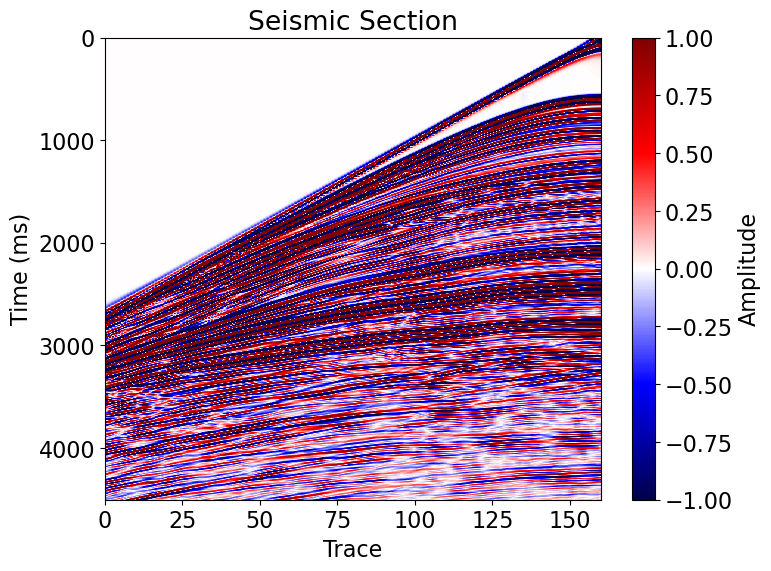

In [17]:
plt.imshow(shot_gathers[0], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmax=1, vmin=-1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

In [16]:
import numpy as np
from scipy.signal import resample_poly

n_shot = 125
n_sample = 1126
n_receiver = 160
dt_old = 4  # ms
dt_new = dt  # ms

# Data
data = np.array(shot_gathers)

# Hitung upsample dan downsample factor
from fractions import Fraction
factor = Fraction(dt_old / dt_new).limit_denominator(1000)
up, down = factor.numerator, factor.denominator

print(f"Upsample: {up}, Downsample: {down}")

# Output array
n_sample_new = int(np.ceil(n_sample * up / down))
data_resampled = np.zeros((n_shot, n_sample_new, n_receiver))

# Loop resample
for shot in range(n_shot):
    for rec in range(n_receiver):
        trace = data[shot, :, rec]
        data_resampled[shot, :, rec] = resample_poly(trace, up, down)


Upsample: 2712, Downsample: 977


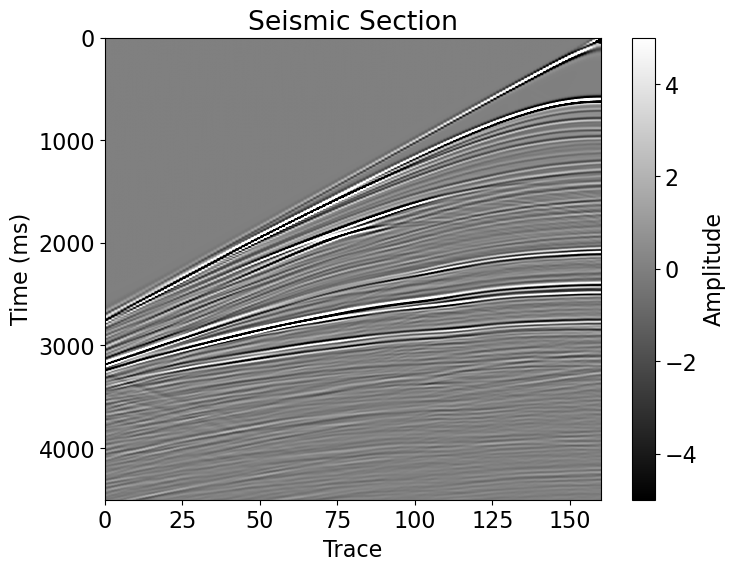

In [17]:
plt.imshow(data_resampled[0], aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmax=5, vmin=-5)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

In [18]:
data_resampled[0].shape
#shot_gathers[0].shape

(3126, 160)

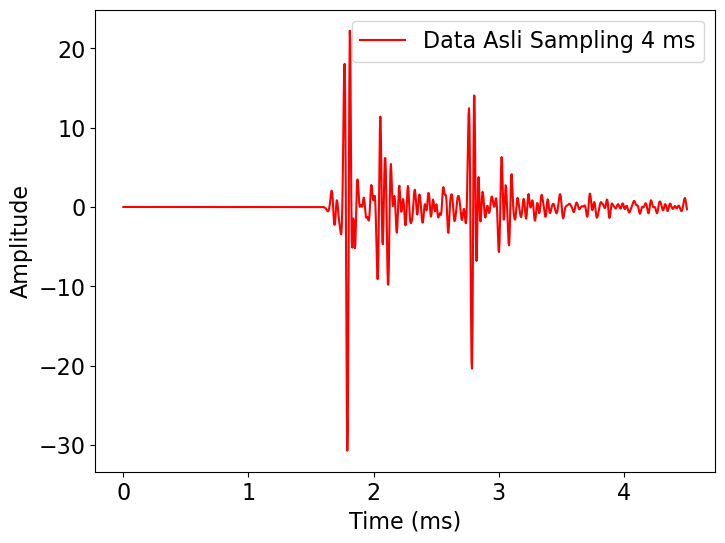

In [19]:
shot_cek = 0
CDP_cek = 60
tt = np.linspace(0, 4504, len(shot_gathers[shot_cek]))/1000
plt.plot(tt, shot_gathers[shot_cek][:,CDP_cek], 'r', label='Data Asli Sampling 4 ms')
plt.ylabel("Amplitude")
plt.xlabel("Time (ms)")
plt.legend()
plt.show()

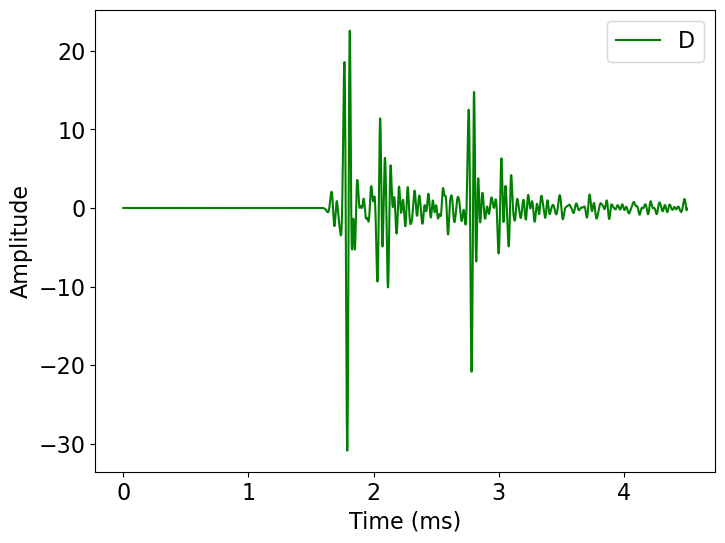

In [20]:
shot_cek = 0
CDP_cek = 60
tt = np.linspace(0, 4504, len(data_resampled[shot_cek]))/1000
plt.plot(tt, data_resampled[shot_cek][:,CDP_cek], 'g')
plt.ylabel("Amplitude")
plt.xlabel("Time (ms)")
plt.legend(f'Data Resample Sampling {dt} ms')
plt.show()

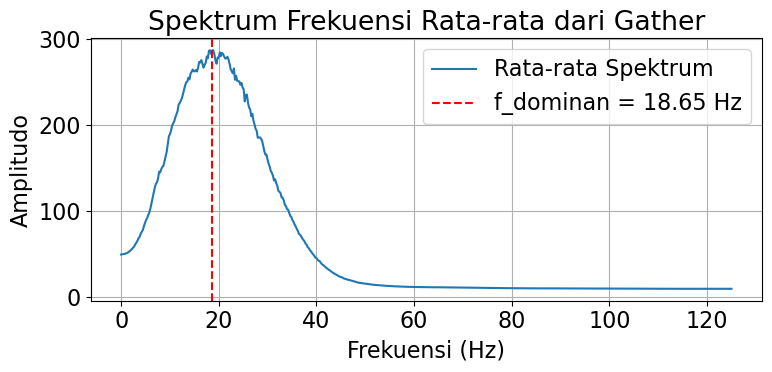

Frekuensi dominan: 18.65 Hz


In [21]:
# Misal kamu punya gather dengan shape (2000, 160), dt = 0.001 (1 ms)
f_dominan_asli, frekuensi_asli, spektrum_asli = dominant_frequency(shot_gathers[0], dt=(4/1000))
print(f"Frekuensi dominan: {f_dominan_asli:.2f} Hz")

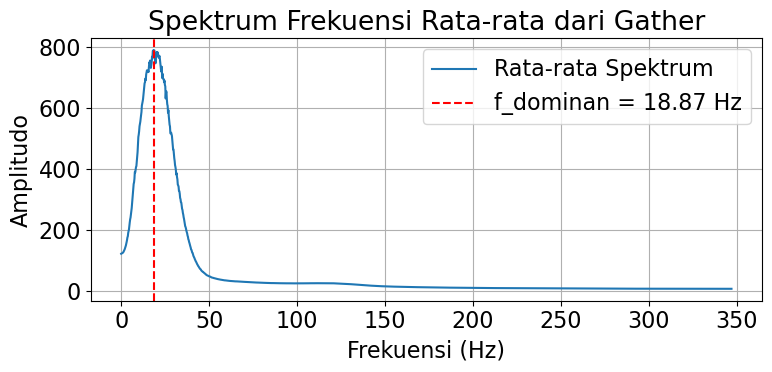

Frekuensi dominan: 18.87 Hz


In [22]:
# Misal kamu punya gather dengan shape (2000, 160), dt = 0.001 (1 ms)
f_dominan, frekuensi, spektrum = dominant_frequency(data_resampled[0], dt=(dt/1000))
print(f"Frekuensi dominan: {f_dominan:.2f} Hz")

In [23]:
from devito import Eq, Operator

# Computes the residual between observed and synthetic data into the residual
def compute_residual(residual, dobs, dsyn, kg):
    if residual.grid.distributor.is_parallel:
        # If we run with MPI, we have to compute the residual via an operator
        # First make sure we can take the difference and that receivers are at the 
        # same position
        assert np.allclose(dobs.coordinates.data[:], dsyn.coordinates.data)
        assert np.allclose(residual.coordinates.data[:], dsyn.coordinates.data)
        # Create a difference operator
        diff_eq = Eq(residual, dsyn.subs({dsyn.dimensions[-1]: residual.dimensions[-1]}) -
                               dobs.subs({dobs.dimensions[-1]: residual.dimensions[-1]}))
        Operator(diff_eq)()
    else:
        # Data ukuran (1920 x 120)
        data_1 = dsyn.data[:]
        data_2 = dobs.data[:]

        # Data ukuran (1920 x 120)
        

        # Pastikan data_2 menjadi array 1D untuk keperluan konvolusi
        filter_data1 = dobs.data[:,kg]
        filter_data2 = dsyn.data[:,kg]


        for i in range(residual.data.shape[1]):
            # Panjang data asli
            len_data1 = len(data_1)

            # Panjang hasil korelasi
            len_full = len(convolve(filter_data1, data_1[:, i], mode='full'))

            # Indeks untuk mengambil nilai tengah
            start = (len_full - len_data1) // 2
            end = start + len_data1
            
            residual.data[:, i] = convolve(data_1[:, i], filter_data1, mode='full')[:len_data1] - convolve(data_2[:, i], filter_data2, mode='full')[:len_data1]
        
        misfit_SI = deepcopy(residual)
         # Data berukuran (1920 x 1)
        
        data_1 = dobs.data[:,kg]

        # Data berukuran (1920 x 120)
        data_2 = residual.data[:]    
        # Menyimpan hasil cross-correlation
        cross_correlations = []
        len_data = len(data_1)
        # Lakukan cross-correlation untuk setiap kolom di data_2
        for i in range(data_2.shape[1]):
            result = correlate(data_2[:, i], data_1, mode='full')[len_data-1:]
            cross_correlations.append(result)
        residual.data[:] = np.array(cross_correlations).T

        residual.data[:,159] *=0
        residual.data[:,158] *=0
        
        #residual.data[:] = ((residual.data[:] - residual.data[:].min())/(residual.data[:].max()-residual.data[:].min()))*((dobs.data[:].max()-dobs.data.min())+dobs.data.min())
    return misfit_SI

In [24]:
def misfit(vp_in):
    objective = 0.
    for i in range(nshots):
        # Compute synthetic data with forward operator 
        from examples.seismic.acoustic import AcousticWaveSolver

        solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        
        # Create placeholders for the data residual and data
        residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
        d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
        d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[i], rec=d_obs)
        d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
        _, _, _ = solver.forward(vp=vp_in.vp, src=srcs[i], rec=d_syn)

        # Compute gradient from data residual and update objective function 
        misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        objective += 0.5*norm(misfit_SI)**2
        #residual.data[:] = d_obs.data[:] - d_syn.data[:]
        #objective += 0.5*norm(residual)**2
    return objective
    

In [25]:
def cubic_interpolation(alpha0, alpha1, f0, f1, df0, df1):
    """
    alpha0 = 0 (biasanya)
    alpha1 = nilai alpha awal (misal 1)
    f0, f1 = nilai fungsi misfit di alpha0 dan alpha1
    df0, df1 = arah turun di alpha0 dan alpha1 (dot product grad * direction)
    """

    d1 = df0 + df1 - 3 * ((f0 - f1) / (alpha0 - alpha1))
    d2 = np.sign(alpha1 - alpha0) * np.sqrt(d1**2 - df0 * df1)

    alpha_new = alpha1 - (alpha1 - alpha0) * (df1 + d2 - d1) / (df1 - df0 + 2*d2)
    alpha_new = max(0.1 * alpha1, min(alpha_new, 0.9 * alpha1))
    return alpha_new


def linesearch(vp_in, ff, g, p, a=0.0001, b=0.1, l=1, max_iter=5, max_l=5., min_l= 0.1, scale_l = 2):
    from copy import deepcopy
    from devito import mmax
    import numpy as np
    import time as tm

    ni = 0
    g_inner = g.data[nboundary:-nboundary, nboundary:-nboundary]
    p_inner = p.data[nboundary:-nboundary, nboundary:-nboundary]
    gtp = np.sum(g_inner * p_inner) # gradien awal dot arah
    best_l = 0
    best_ff2 = ff
    gtp_best = np.copy(gtp)
    g2_best = deepcopy(g)

    l_option = 0.
    ff_option = 0.
    g_option = deepcopy(g)
    g_option = deepcopy(g)


    while ni < max_iter:
        vp2 = deepcopy(vp_in)
        vp2.vp.data[:] = vp_in.vp.data[:] + (l) * (p.data[:])
        vp2.vp.data[:] = np.clip(vp2.vp.data[:], 1.5, 4.7)

        start_time = tm.time()

        time_start = datetime.now()
        print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))
        
        ff2, g2 = fwi_gradient(vp2.vp)
        end_time = tm.time()

        print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
        
        g2.data[:] *= -1
        g2_inner = g2.data[nboundary:-nboundary, nboundary:-nboundary]
        g2tp = np.sum(g2_inner[:] * p_inner)

        if l == 0:
            l = min_l

        if ff2 > ff:
            p.data[:] = deepcopy(g.data[:])
            p.data[:] *= -1

        if ff2 < ff :
           l_option = deepcopy(l)
           ff_option = deepcopy(ff2)
           g_option = deepcopy(g)

        # Cek sufficient decrease (Armijo)
        print(f"ff2 = {ff2}, ff + a * l * gtp = {ff + a * l * gtp}, a*l*gtp = {a*l*gtp}")
        print(f"abs(g2tp) = {abs(g2tp)}, abs(b*gtp) = {abs(b*gtp)}")
        print(f"g2tp = {(g2tp)}, (b*gtp) = {(b*gtp)}")
        print(" ")
        if ff2 <= ff + a * l * gtp:
            # Simpan sebagai kandidat terbaik jika Armijo terpenuhi
            if best_l == 0 or ff2 < best_ff2:
                best_l = l
                best_ff2 = ff2
                gtp_best = deepcopy(g2tp)
                g2_best.data[:] = g2.data[:]

            # Cek curvature condition
            if (g2tp) >= (b * gtp):
                print(f"Strong Wolfe satisfied, l best : {l}")
                best_l = l
                best_ff2 = ff2
                gtp_best = deepcopy(g2tp)
                g2_best.data[:] = g2.data[:]

                return best_l, best_ff2, g2_best  # Strong Wolfe satisfied
            else:
                if l >= max_l:
                    l = cubic_interpolation(best_l, l, ff, best_ff2, gtp, gtp_best)
                    print(f"Armijo satisfied but curvature not satisfied and l>{max_l}, l update : {l}")
                else:
                  l *= scale_l
                  print(f"Armijo satisfied but curvature not satisfied, l update : {l}")
        else:
          if ff2 < ff :
            if (g2tp) >= (b * gtp):
               l*=scale_l
               print(f"Armijo not satisfied, ff2 < ff, but curvature satisfied l update : {l}")
            else :
               l = cubic_interpolation(best_l, l, ff, best_ff2, gtp, gtp_best)
               print(f"Armijo not satisfied, ff2<ff, curvature not satisfied l update : {l}")
          else:
                l = cubic_interpolation(best_l, l, ff, best_ff2, gtp, gtp_best)
                print(f"nether wolve satisfied and l>{max_l}, l update : {l}")
        ni += 1
        nshots
    if best_l != 0 :
        print(f"Strong Wolfe not satisfied. Returning best Armijo-satisfying l : {best_l}")
        return best_l, best_ff2, g2_best
    else:
        if (l_option == 0):
            best_l = cubic_interpolation(best_l, l, ff, best_ff2, gtp, gtp_best)
            vp2 = deepcopy(vp_in)
            vp2.vp.data[:] = vp_in.vp.data[:] + (l) * (p.data[:])
            vp2.vp.data[:] = np.clip(vp2.vp.data[:], 1.5, 4.7)

            start_time = tm.time()
            time_start = datetime.now()
            
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            ff2, g2 = fwi_gradient(vp2.vp)
            
            end_time = tm.time()
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")


            best_ff2 = deepcopy(ff2)
            g2_best = deepcopy(g2)
            print(f"No condition satisfied. Returning l interpolated : {best_l}")
        else :
           best_l = deepcopy(l_option)
           best_ff2 = deepcopy(ff_option)
           g2_best = deepcopy(g_option)
        return best_l, best_ff2, g2_best


def cg_fr(g0, g1, p):
  g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
  g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
  B = np.sum(g0_inner*g1_inner)/np.sum(g0_inner*g0_inner)
  p.data[:] = -1*g1.data[:] + B*p.data[:]
  p.data[:] /= np.max(np.abs(p.data[:]))
  
  print(f"Nilai B : {B}")
  return p


def cg_pr(g0, g1, p):
    g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
    g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
    y = g1_inner - g0_inner
    B = np.sum(g1_inner * y) / np.sum(g0_inner * g0_inner)
    if B < 0:
        B = 0  # Reset jika tidak descent
    p.data[:] = -1 * g1.data[:] + B * p.data[:]
    p.data[:] /= np.max(np.abs(p.data[:]))

    print(f"Nilai B : {B}")
    return p

def cg_hs(g0, g1, p):
    g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
    g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
    p_inner = p.data[nboundary:-nboundary, nboundary:-nboundary]
    y = g1_inner - g0_inner
    denom = np.sum(p_inner * y)
    if denom == 0:
        B = 0  # Hindari pembagian nol
    else:
        B = np.sum(g1_inner * y) / denom
    if B < 0:
        B = 0  # Reset jika arah tidak descent
    p.data[:] = -1 * g1.data[:] + B * p.data[:]
    p.data[:] /= np.max(np.abs(p.data[:]))

    print(f"Nilai B : {B}")
    return p

In [26]:
from devito import Function

waterheight = 36
watermute = Function(name="watermute", grid=model0.grid)
watermute.data[:,nboundary+waterheight:] += 1

modelpad = 160
modelpadmute = Function(name="modelpadmute", grid=model0.grid)
modelpadmute.data[nboundary+modelpad:,:] += 1
#modelpadmute.data[280-(nboundary+modelpad):280,:] = 0

In [27]:
from devito import Function, mmax
from examples.seismic.acoustic import AcousticWaveSolver
from examples.seismic import Receiver
from devito import norm
import numpy as np

def fwi_gradient_per_shot(i, geometrys, srcs, data_resampled, nearest_indices, vp_in):

    grad = Function(name="grad", grid=model0.grid)
    
    solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
    
    residual = Receiver(name='residual', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
    d_obs = Receiver(name='d_obs', grid=model0.grid,
                     time_range=geometrys[i].time_axis, 
                     coordinates=geometrys[i].rec_positions)
    d_syn = Receiver(name='d_syn', grid=model0.grid,
                    time_range=geometrys[i].time_axis, 
                    coordinates=geometrys[i].rec_positions)

    d_obs.data[:] = data_resampled[i]
    
    _, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)

    compute_residual(residual, d_obs, d_syn, nearest_indices[i])
    
    phi = .5 * norm(residual)**2
    
    solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)
    
    return phi, grad.data




import multiprocessing as mp

num_workers = 3  # atur jumlah core di sini


def fwi_gradient_parallel(vp_in):
    with mp.Pool(processes=num_workers) as pool:
        results = pool.starmap(
            fwi_gradient_per_shot,
            [(i, geometrys, srcs, data_resampled, nearest_indices, vp_in)
             for i in range(nshots)]
        )
    
    grad = Function(name="grad", grid=model0.grid)
    gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    total_phi = 0.0

    for phi_i, grad_i in results:
        grad.data[:] += grad_i
        total_phi += phi_i

    grad.data[:] *= watermute.data[:]
    grad.data[:] *= modelpadmute.data[:]

    gradNormalized.data[:] = grad.data[:]/mmax(grad)

    return total_phi, gradNormalized


In [30]:
# Create FWI gradient kernel 
from devito import Function, TimeFunction, norm, mmax

from examples.seismic import Receiver, plot_shotrecord

import scipy
def fwi_gradient(vp_in):    
    # Create symbols to hold the gradient
    grad = Function(name="grad", grid=model0.grid)
    
    objective = 0.
    for i in range(nshots):
        # Compute synthetic data with forward operator 
        from examples.seismic.acoustic import AcousticWaveSolver

        solver = AcousticWaveSolver(model1, geometrys[i], space_order=8)
        
        # Create placeholders for the data residual and data
        residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
        d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
        d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obs)
        d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
        _, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)
        
        #plot_shotrecord(d_syn.data[:], mresidual.data[:,159] *=0odel0, t0,tn)
        # Compute gradient from data residual and update objective function 
        misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        objective += .5*norm(misfit_SI)**2
        
        #residual.data[:] = d_obs.data[:] - d_syn.data[:]
        #objective += .5*norm(residual)**2
        
        #plot_shotrecord(residual.data, model, t0, tn)
        solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)
        
        
    gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    #Normalisasi ke rentang [-1, 1]
    gradNormalized.data[:] = grad.data[:]
    gradNormalized.data[:] *= watermute.data[:]
    gradNormalized.data[:] *= modelpadmute.data[:]
    gradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])
    gradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))
    
    return objective, gradNormalized

In [29]:
model0.m

vp(x, y)**(-2)

In [59]:
from examples.seismic.acoustic import AcousticWaveSolver, AdjointOperator

i = 124

vp_in = model0.vp


solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        

grad = Function(name="grad", grid=model0.grid)
        # Create placeholders for the data residual and data
residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obs)
d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
_, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)
        
        #plot_shotrecord(d_syn.data[:], model0, t0,tn)
        # Compute gradient from data residual and update objective function 
#compute_residual(residual, d_obs, d_syn, nearest_indices[62])
residual.data[:] = d_obs.data[:] - d_syn.data[:]
        
objective = .5*norm(residual)**2


        #plot_shotrecord(residual.data, model, t0, tn)
_, v0, _ = solver.adjoint(rec=residual, vp=vp_in, save=True)



'''solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)

gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    #Normalisasi ke rentang [-1, 1]
gradNormalized.data[:] = grad.data[:]
gradNormalized.data[:] *= watermute.data[:]
gradNormalized.data[:] *= modelpadmute.data[:]
gradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])
gradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))'''

No source type defined, returning uninitiallized (zero) source
No source type defined, returning uninitiallized (zero) source


'solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)\n\ngradNormalized = Function(name="gradNormalized", grid=model0.grid)\n    #Normalisasi ke rentang [-1, 1]\ngradNormalized.data[:] = grad.data[:]\ngradNormalized.data[:] *= watermute.data[:]\ngradNormalized.data[:] *= modelpadmute.data[:]\ngradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])\ngradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))'

In [60]:
v0.data.shape

(3126, 1472, 424)

In [62]:
print(dt*3125)

4503.124952316284


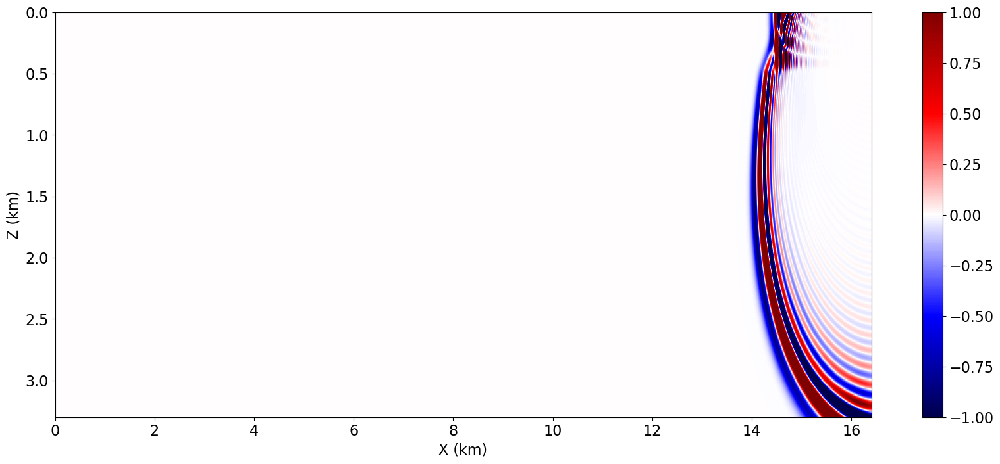

In [63]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(u0.data[1000][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

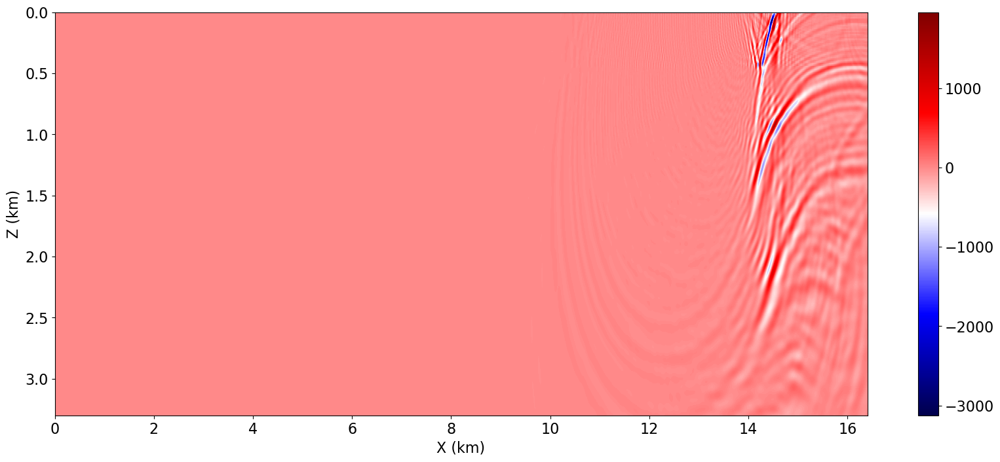

In [64]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(v0.data[1000][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic',aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

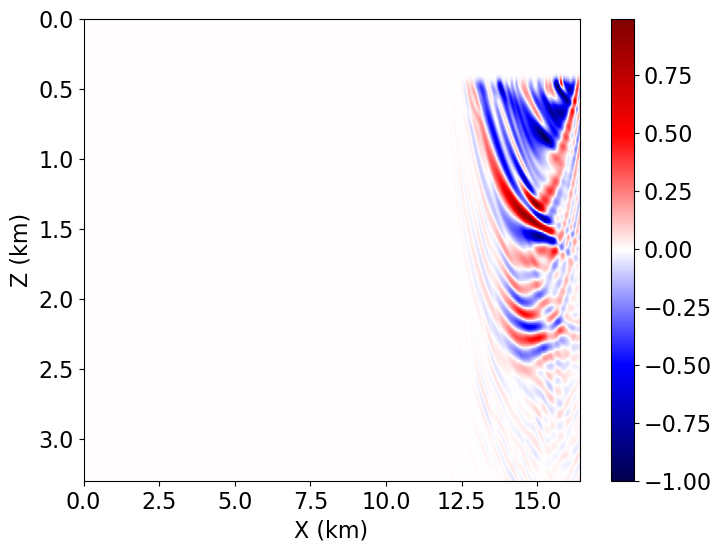

-1.0


In [64]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.imshow(gradNormalized.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

print(gradNormalized.data.min())

In [65]:
import numpy as np
import matplotlib.pyplot as plt

def plot_wavefield_overlay(velocity, wavefield, time_step, cmap_wave='seismic', alpha=0.3):
    """
    Overlay wavefield snapshot pada model velocity.
    
    Parameters:
    - velocity: 2D array (n_x, n_z)
    - wavefield: 3D array (n_time, n_x, n_z)
    - time_step: waktu (index) yang ingin dipilih
    - cmap_wave: colormap untuk wavefield
    - alpha: transparansi overlay wavefield
    """
    fig, ax = plt.subplots(figsize=(10, 6))

    xmin = (origin[0]*spacing[0])/1000
    zmin = (origin[1]*spacing[1])/1000
    xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
    zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000

    velocity = velocity.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]]

    
    # Plot background velocity
    im1 = ax.imshow(velocity.T, cmap='jet', origin='upper', aspect='auto', interpolation='none', vmin=1.5, vmax=4.5)
    
    # Overlay wavefield pada waktu tertentu
    wave = wavefield.data[time_step][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]]
    im2 = ax.imshow(wave.T, cmap=cmap_wave, origin='upper', alpha=alpha, aspect='auto', interpolation='none')
    

    
    plt.colorbar(im1, ax=ax, label='Velocity (m/s)')
    plt.colorbar(im2, ax=ax, label='Wavefield Amplitude', orientation='vertical')
    
    ax.set_title(f'Wavefield overlay at time step {time_step}')
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    plt.tight_layout()
    plt.figure(figsize=(20, 8))
    plt.show()

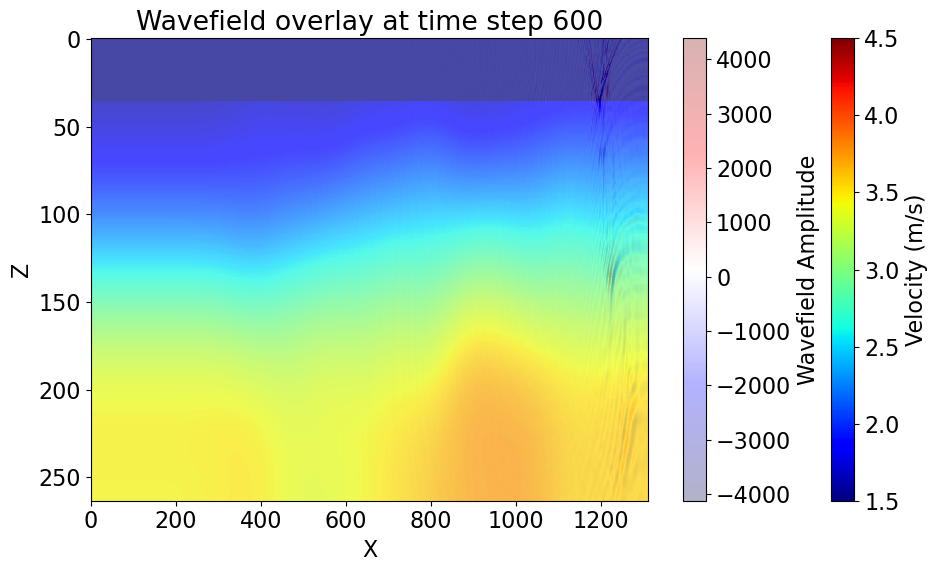

<Figure size 2000x800 with 0 Axes>

In [66]:
plot_wavefield_overlay(velocity=model0, wavefield=v0, time_step=600)

In [65]:
from examples.seismic.acoustic import AcousticWaveSolver
from copy import deepcopy

i = 124

solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        
# Create placeholders for the data residual and data
residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
grad = Function(name="grad", grid=model0.grid)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obdata_1,s)
d_obs.data[:] = data_resampled[i]
#d_obs.data[:] /= norm(d_obs)

        # Compute smooth data and full forward wavefield u0
_, u0, _ = solver.forward(vp=model0.vp, save=True, src=srcs[i], rec=d_syn)

#d_syn.data[:] /= norm(d_syn)
        
        #plot_shotrecord(d_syn.data[:], model0, t0,tn)
        # Compute gradient from data residual and update objective function 
misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        
objective = .5*norm(misfit_SI)**2

alpha = np.sum(d_obs.data[:] * d_syn.data[:])/np.sum(d_syn.data[:] * d_obs.data[:])
        


'''#solver.gradient(rec=residual, u=u0, vp=model0.vp, grad=grad)

gradNormalized = Function(name="gradNormalized", grid=model.grid)
    #Normalisasi ke rentang [-1, 1]
gradNormalized.data[:] *= watermute.data[:]
gradNormalized.data[:] = grad.data[:]/np.max(np.abs(grad.data[:]))
    #gradNormalized.data[:] *= modelpadmute.data[:]'''

print(f'misfit = {objective}')

misfit = 10994453064144.5


In [98]:
alpha = np.linalg.norm(d_obs.data[:])/np.linalg.norm(d_syn.data[:])

print(alpha)

17.608896


In [99]:
residual = d_obs.data[:] - alpha*d_syn.data[:]

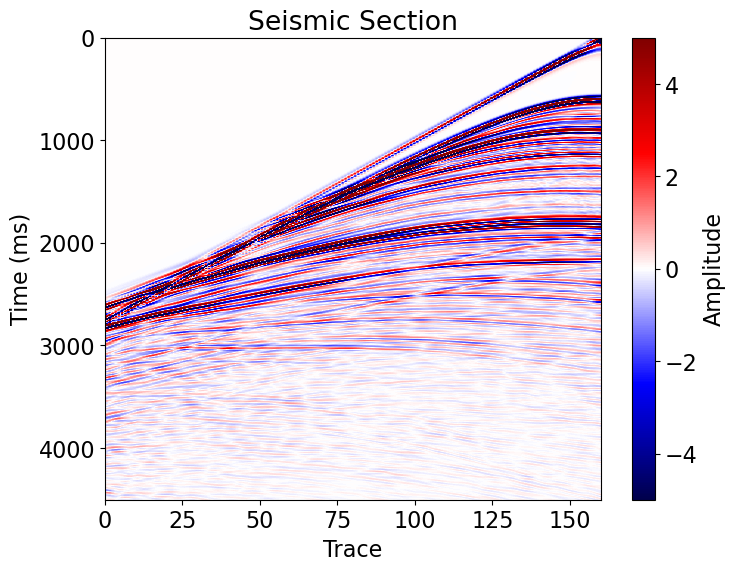

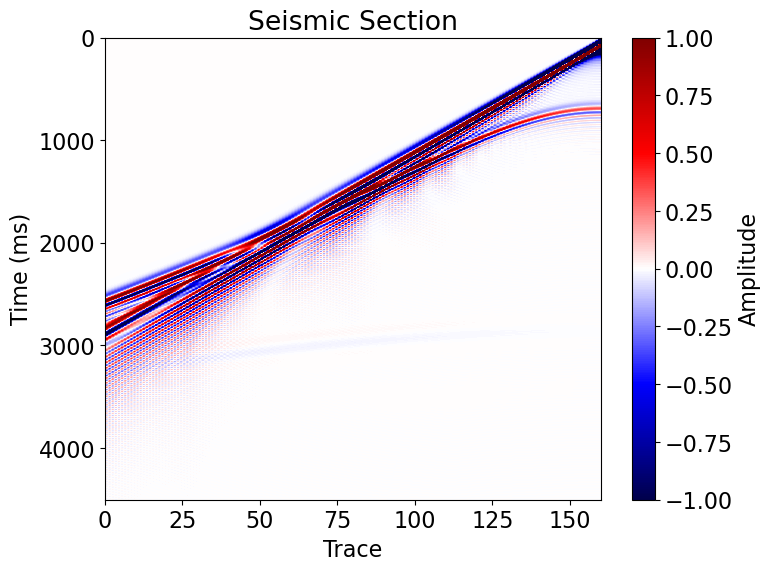

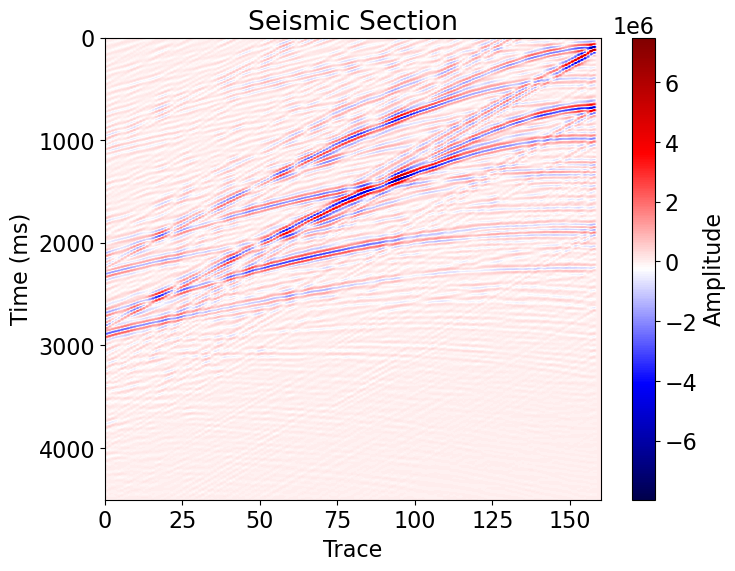

In [66]:
plt.imshow(d_obs.data[:], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmin=-5, vmax=5)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_syn.data[:], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmin = -1, vmax=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(residual.data, aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0])
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

In [103]:
print(np.max(d_obs.data))
print(np.min(d_obs.data))

3836.1362
-1769.6794


In [104]:
print(np.max(d_syn.data))
print(np.min(d_syn.data))

73.96757
-61.250153


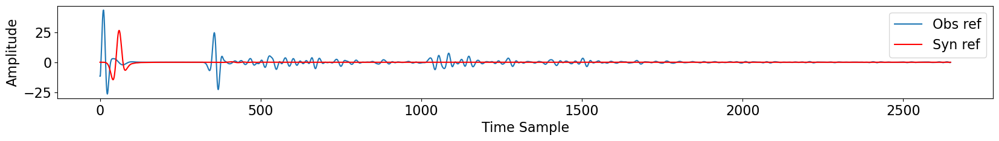

In [92]:
plt.figure(figsize=(20,2))
plt.plot(d_obs.data[:, 158], label="Obs ref")
plt.plot(d_syn.data[:, 158], 'r', label="Syn ref")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend()
plt.show()

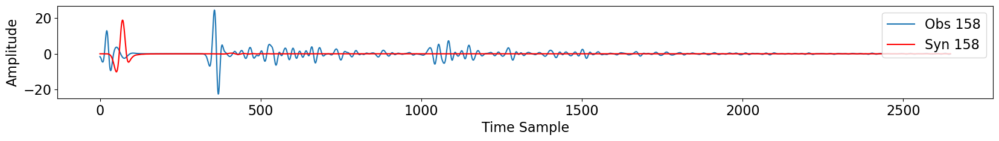

In [97]:
plt.figure(figsize=(20,2))
plt.plot(d_obs.data[:, 157], label="Obs 158")
plt.plot(d_syn.data[:, 157], 'r', label="Syn 158")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc='upper right')
plt.show()

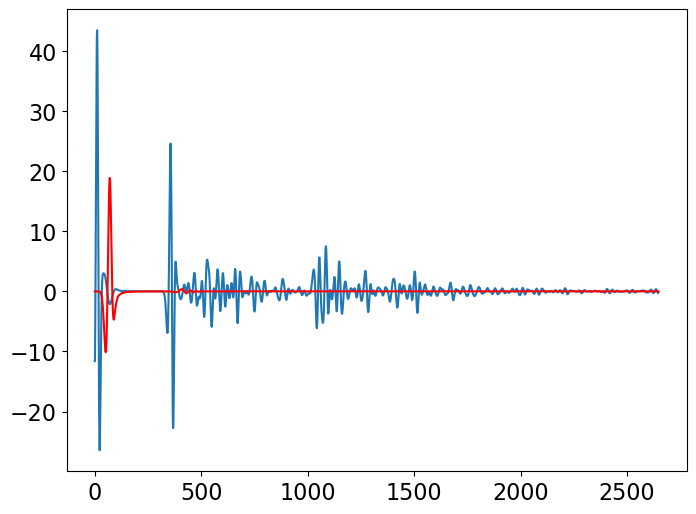

In [78]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_syn.data[:, 157], 'r')
plt.show()

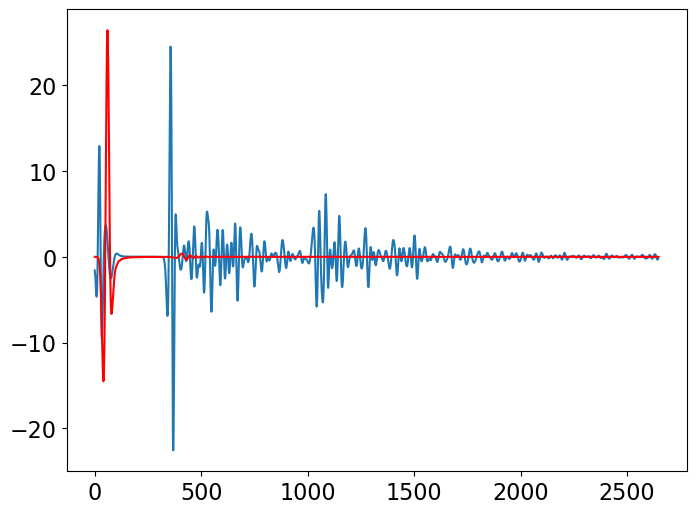

In [79]:
plt.plot(d_obs.data[:, 157])
plt.plot(d_syn.data[:, 158], 'r')
plt.show()

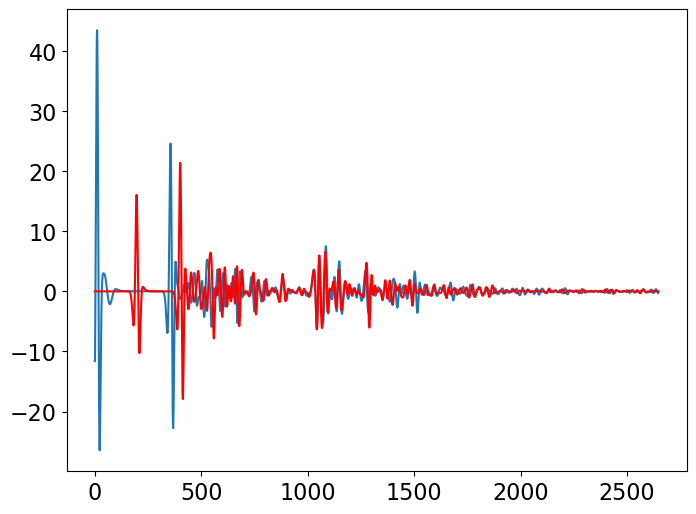

In [76]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_obs.data[:, 140], 'r')
plt.show()

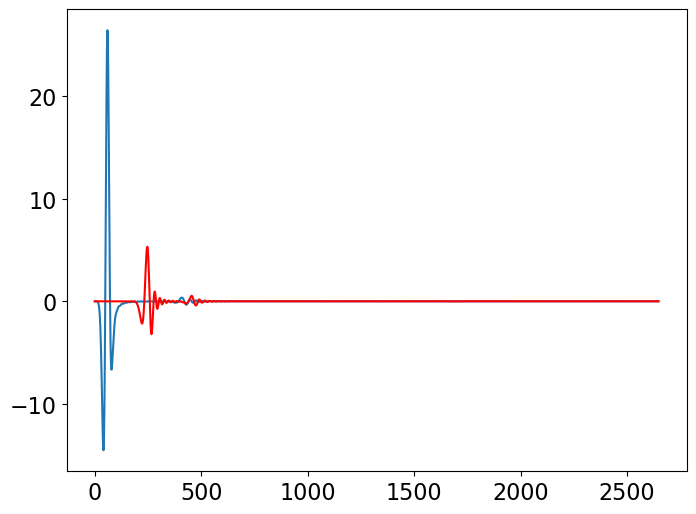

In [77]:
plt.plot(d_syn.data[:, 158])
plt.plot(d_syn.data[:, 140], 'r')
plt.show()

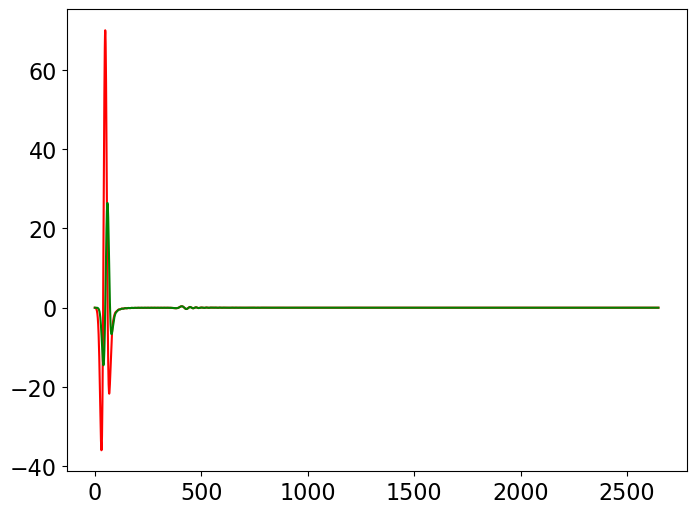

In [73]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 159], 'r')
plt.plot(d_syn.data[:, 158], 'g')
plt.show()

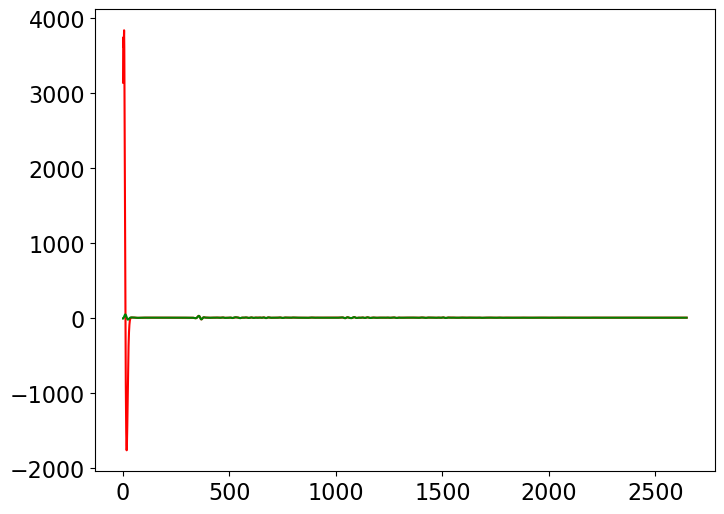

In [74]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:, 159], 'r')
plt.plot(d_obs.data[:, 158], 'g')
plt.show()

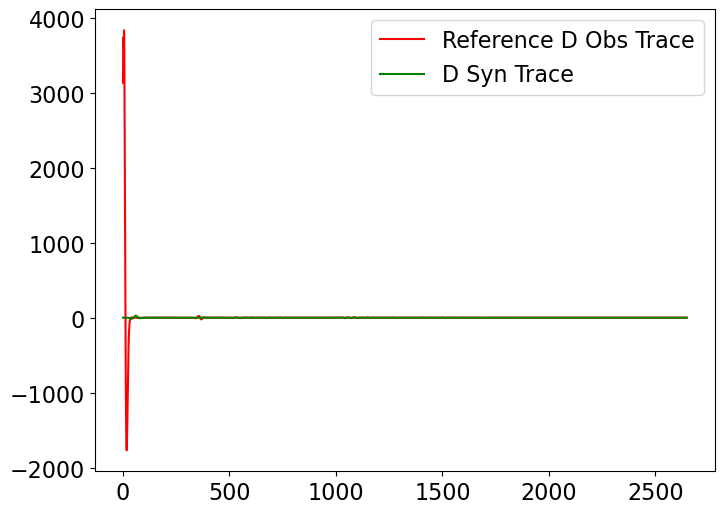

In [76]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:, 159], 'r', label='Reference D Obs Trace')
plt.plot(d_syn.data[:, 158], 'g', label='D Syn Trace')
plt.legend()
plt.show()

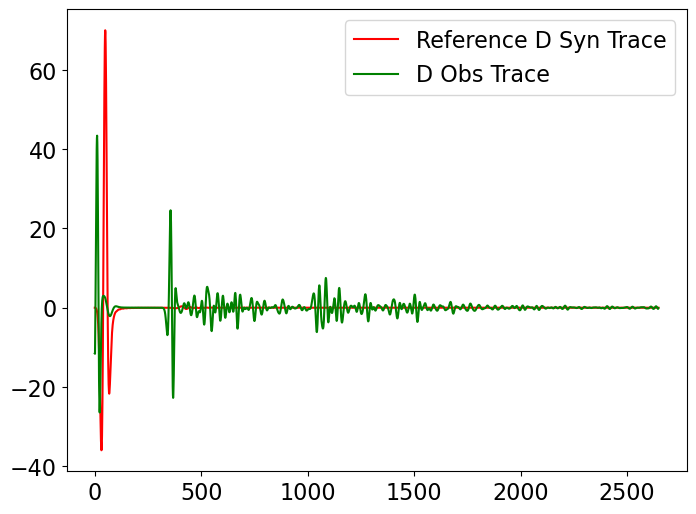

In [77]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 159], 'r', label='Reference D Syn Trace')
plt.plot(d_obs.data[:, 158], 'g', label='D Obs Trace')
plt.legend()
plt.show()

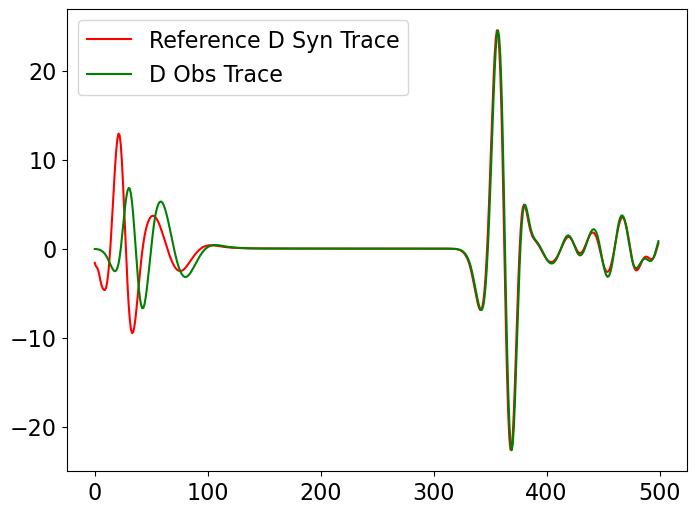

In [78]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:500, 157], 'r', label='Reference D Syn Trace')
plt.plot(d_obs.data[:500, 156], 'g', label='D Obs Trace')
plt.legend()
plt.show()

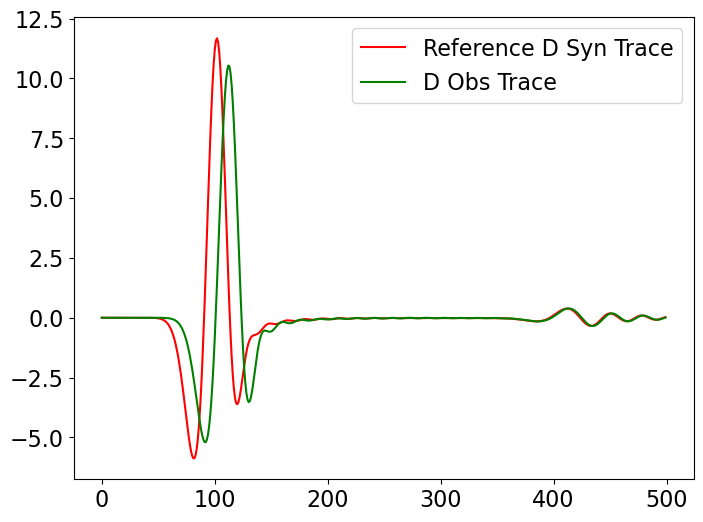

In [79]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:500, 154], 'r', label='Reference D Syn Trace')
plt.plot(d_syn.data[:500, 153], 'g', label='D Obs Trace')
plt.legend()
plt.show()

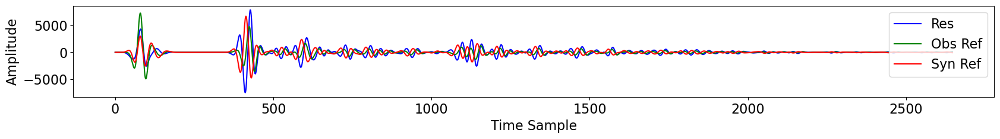

In [105]:
len_data = len(d_obs.data)
trace_cek = 157
trace_ref = 158
residual.data[:, trace_cek] = convolve(d_syn.data[:, trace_cek], d_obs.data[:, trace_ref], mode='full')[:len_data] - convolve(d_obs.data[:, trace_cek], d_syn.data[:, trace_ref], mode='full')[:len_data]

plt.figure(figsize=(20,2))
plt.plot(residual.data[:,trace_cek], 'b', label="Res")
plt.plot(convolve(d_syn.data[:, trace_cek], d_obs.data[:, trace_ref], mode='full')[:len_data], color='g', label="Obs Ref")
plt.plot(convolve(d_obs.data[:, trace_cek], d_syn.data[:, trace_ref], mode='full')[:len_data], color='r', label="Syn Ref")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc="upper right")
plt.show()

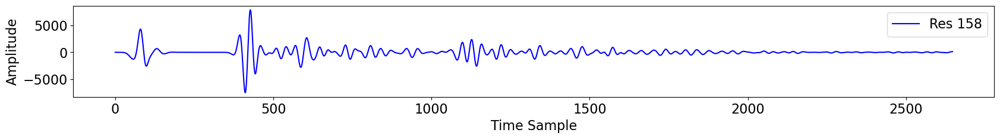

In [102]:
plt.figure(figsize=(20,2))
plt.plot(residual.data[:,trace_cek], 'b', label="Res 158")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc="upper right")
plt.show()

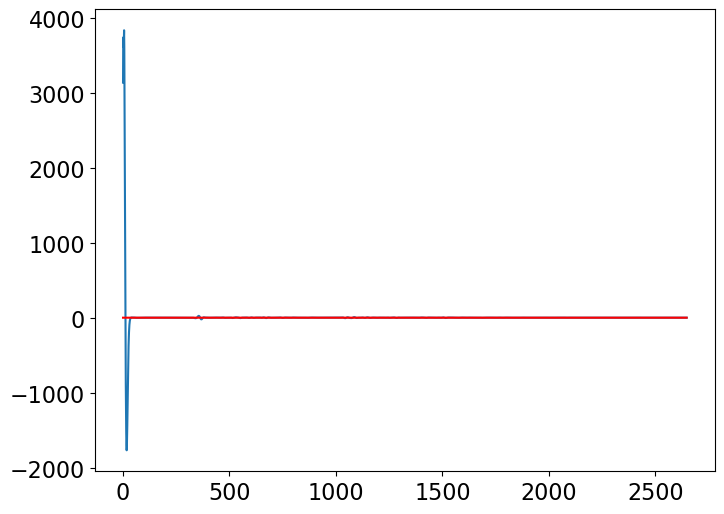

In [84]:
plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 0], 'r')
plt.show()

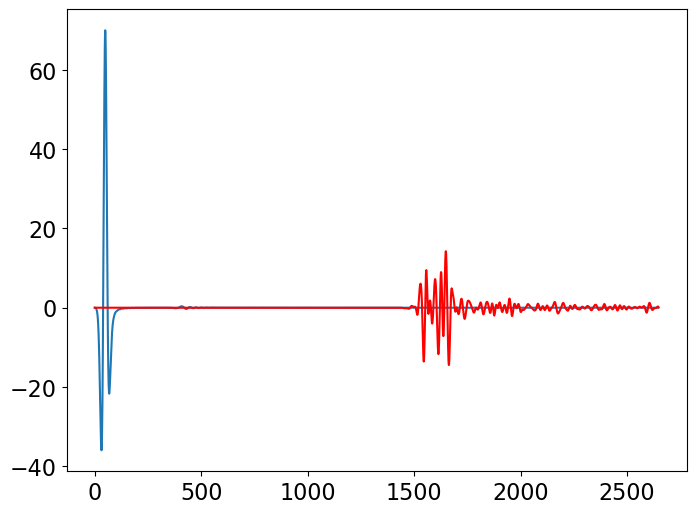

In [85]:
plt.plot(d_syn.data[:, 159])
plt.plot(d_obs.data[:, 0], 'r')
plt.show()

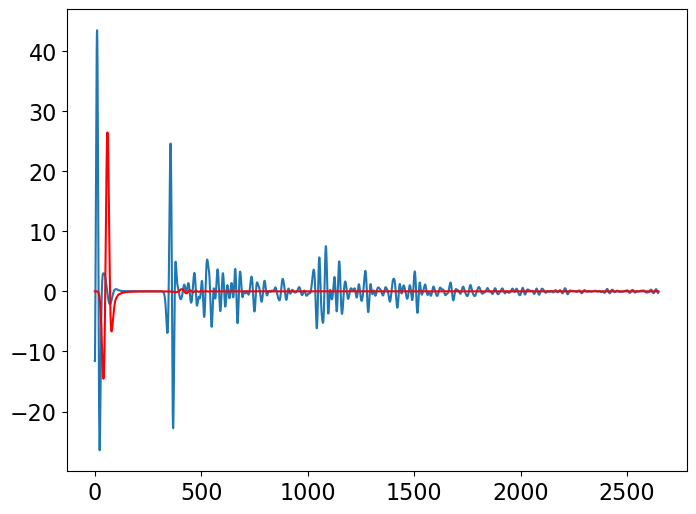

In [86]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_syn.data[:, 158], 'r')
plt.show()

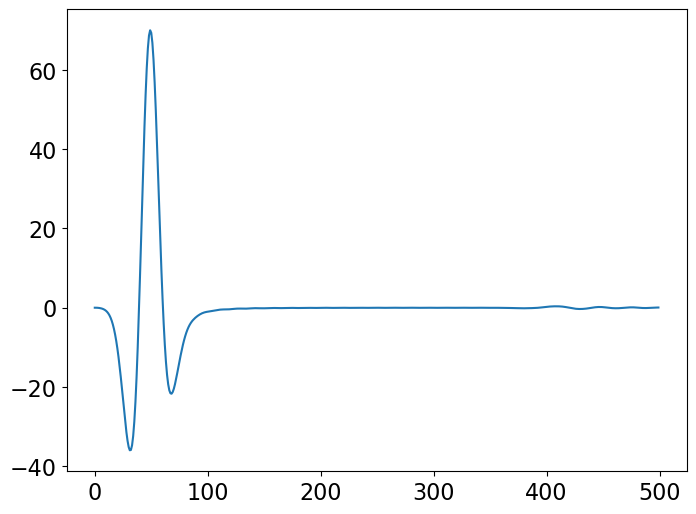

In [87]:
plt.plot(alpha*d_syn.data[:500,159])
plt.show()

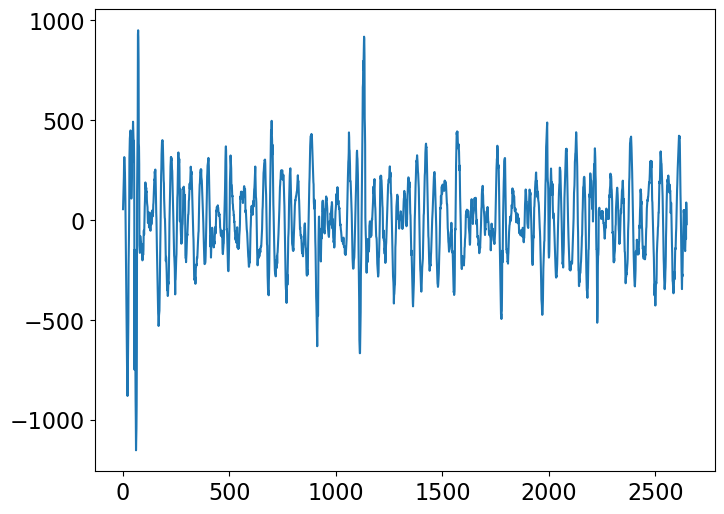

In [88]:
plt.plot(residual.data[:,159])
plt.show()

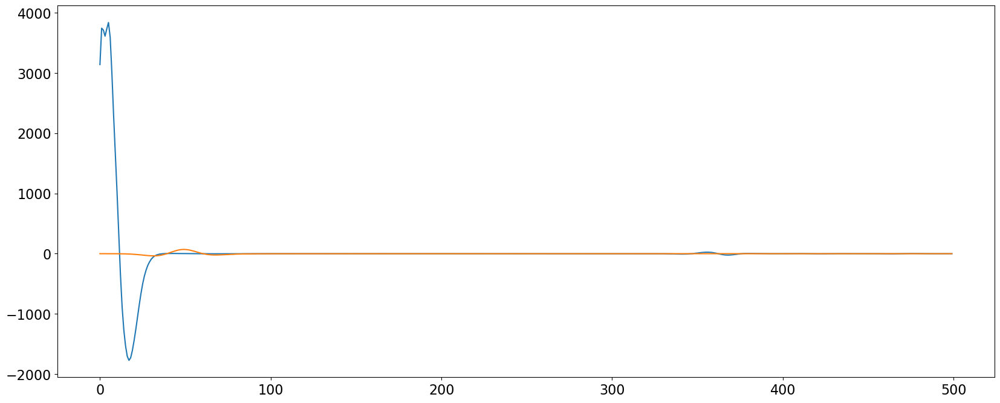

In [89]:
plt.figure(figsize=(20,8))
plt.plot(data_resampled[0][:500, 159])
plt.plot(d_syn.data[:500, 159])
plt.show()

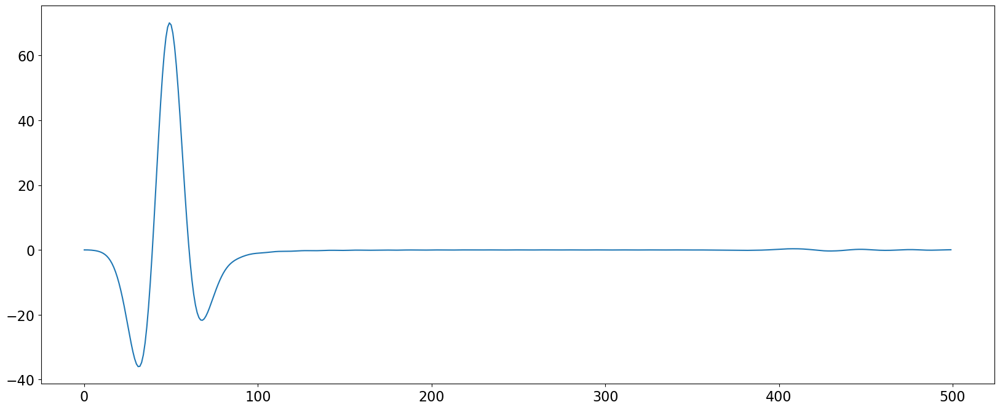

In [90]:
plt.figure(figsize=(20,8))
#plt.plot(data_resampled[0][:500, 159])
plt.plot(d_syn.data[:500, 159])
plt.show()

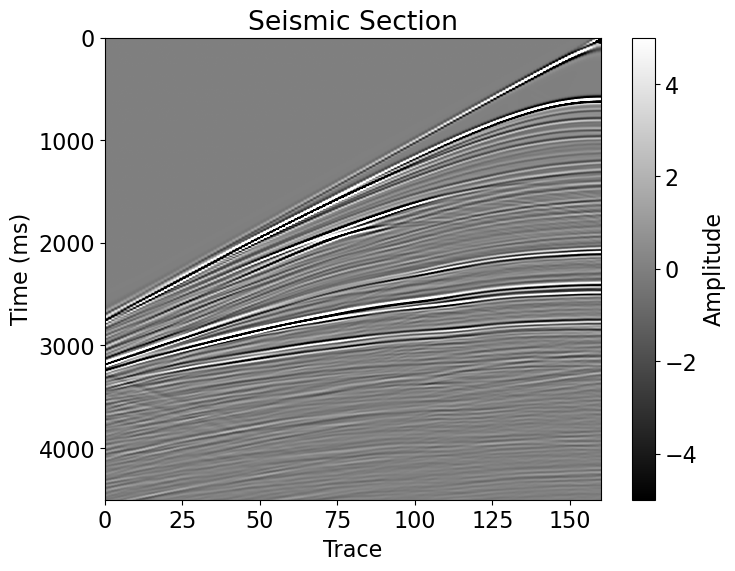

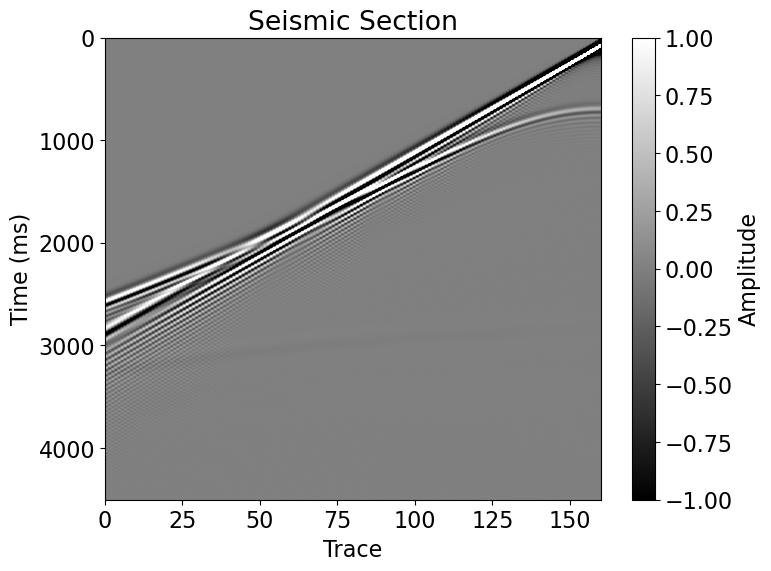

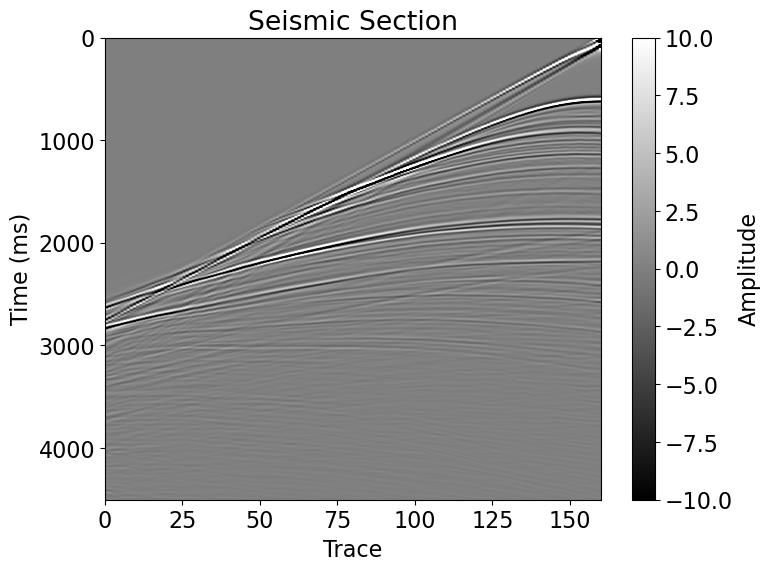

In [91]:
plt.imshow(data_resampled[0], aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-5, vmax=5)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_syn.data[:], aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-1, vmax=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_obs.data-alpha*d_syn.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-10, vmax=10)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

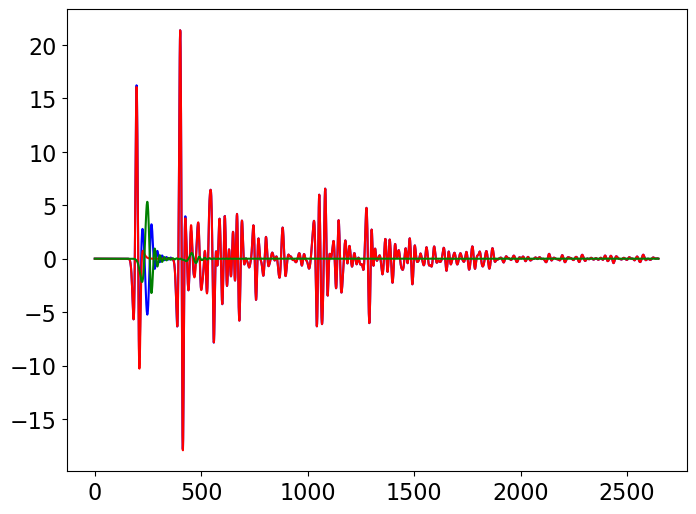

In [92]:
plt.plot(d_obs.data[:, 140]*alpha-d_syn.data[:, 140], 'b')
plt.plot(d_obs.data[:, 140], 'r')
plt.plot(d_syn.data[:, 140], 'g')
plt.show()

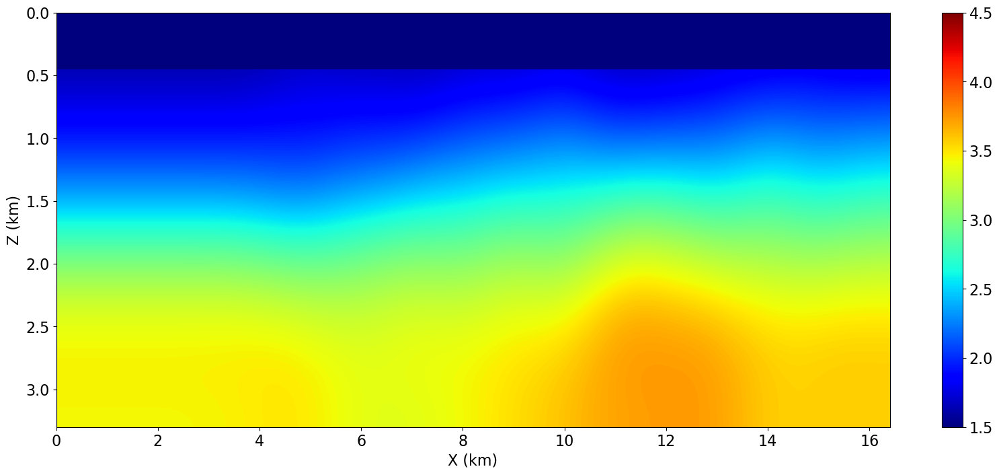

Proses FWI freq 0.002
Program dimulai pada: 14:16:43

Waktu eksekusi: 1324.19 detik

Maksimum p : 0.24114932119846344
Minimum p : -1.0
Norm P : 149.73281860351562
 
FWI freq 0.002 iterasi ke-0/9 : 5468907171725116.0
Program dimulai pada: 14:38:49
Waktu eksekusi: 1321.96 detik
ff2 = 5461556481218638.0, ff + a * l * gtp = 5468907171725114.0, a*l*gtp = -2.2147111328125
abs(g2tp) = 2996.84619140625, abs(b*gtp) = 2214.7111328125
g2tp = -2996.84619140625, (b*gtp) = -2214.7111328125
 
Armijo satisfied but curvature not satisfied, l update : 2
Program dimulai pada: 15:00:51
Waktu eksekusi: 1322.24 detik
ff2 = 5461507040360820.0, ff + a * l * gtp = 5468907171725112.0, a*l*gtp = -4.429422265625
abs(g2tp) = 3889.85546875, abs(b*gtp) = 2214.7111328125
g2tp = 3889.85546875, (b*gtp) = -2214.7111328125
 
Strong Wolfe satisfied, l best : 2


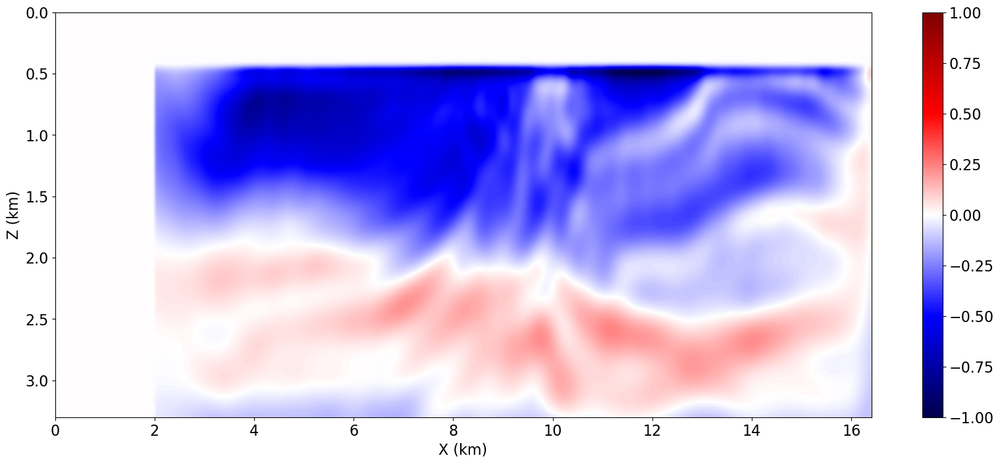

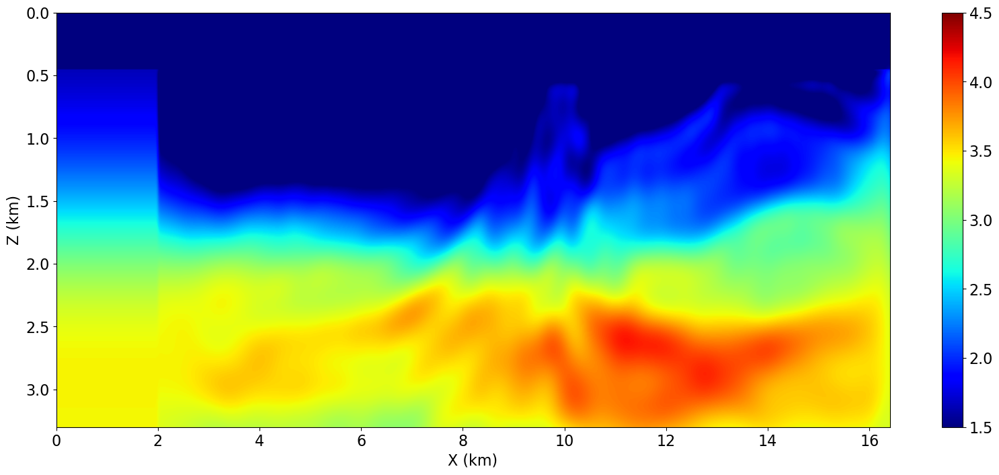

Nilai B : 0.8766859173774719
Maksimum p : 0.6028432250022888
Minimum p : -1.0
Norm P : 138.75814819335938
 
FWI freq 0.002 iterasi ke-1/9 : 5461507040360820.0
Program dimulai pada: 15:22:54
Waktu eksekusi: 1319.91 detik
ff2 = 5466546919573476.0, ff + a * l * gtp = 5461507040360818.0, a*l*gtp = -1.5444691406250002
abs(g2tp) = 8431.7666015625, abs(b*gtp) = 1544.4691406250001
g2tp = 8431.7666015625, (b*gtp) = -1544.4691406250001
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 15:44:54
Waktu eksekusi: 1319.05 detik
ff2 = 5462402052849500.0, ff + a * l * gtp = 5461507040360820.0, a*l*gtp = -0.15444691406250002
abs(g2tp) = 19298.412109375, abs(b*gtp) = 1544.4691406250001
g2tp = 19298.412109375, (b*gtp) = -1544.4691406250001
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 16:06:53
Waktu eksekusi: 1320.99 detik
ff2 = 5461594761707328.0, ff + a * l * gtp = 5461507040360820.0, a*l*gtp = -0.015444691406250002
abs(g2tp) = 19919.576

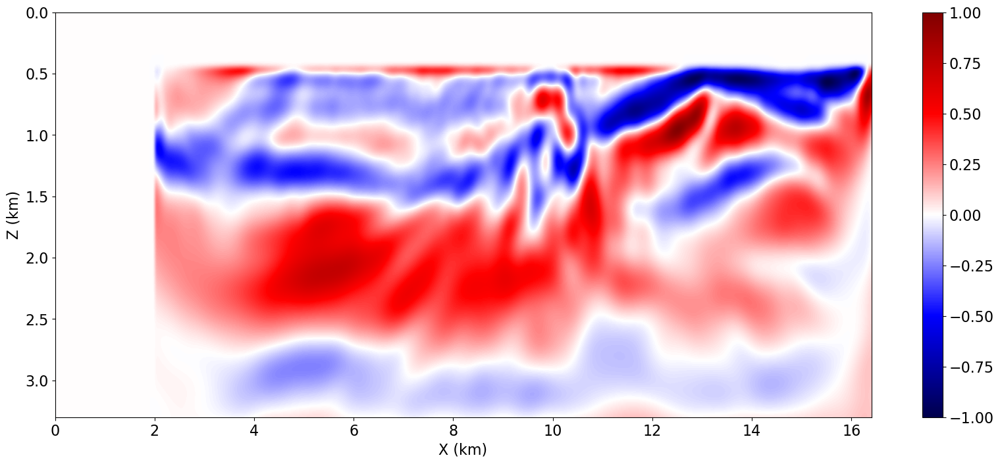

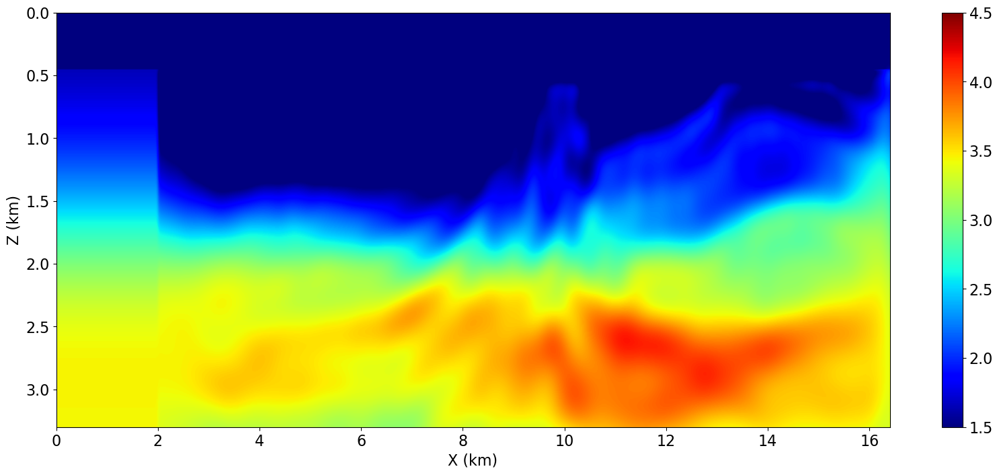

Nilai B : 1.0000560283660889
Maksimum p : 0.568684995174408
Minimum p : -1.0
Norm P : 57.050148010253906
 
FWI freq 0.002 iterasi ke-2/9 : 5461505852539824.0
Program dimulai pada: 17:35:19
Waktu eksekusi: 1401.71 detik
ff2 = 5466080010139568.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.0010746463775634766
abs(g2tp) = 2195.57568359375, abs(b*gtp) = 1.0746463775634767
g2tp = 2195.57568359375, (b*gtp) = -1.0746463775634767
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 17:58:40
Waktu eksekusi: 1411.55 detik
ff2 = 5461367280538582.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.00010746463775634766
abs(g2tp) = 18518.4296875, abs(b*gtp) = 1.0746463775634767
g2tp = -18518.4296875, (b*gtp) = -1.0746463775634767
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 18:22:12
Waktu eksekusi: 1396.50 detik
ff2 = 5461602096476102.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.00021492927551269533
abs(g2tp) = 14071.04

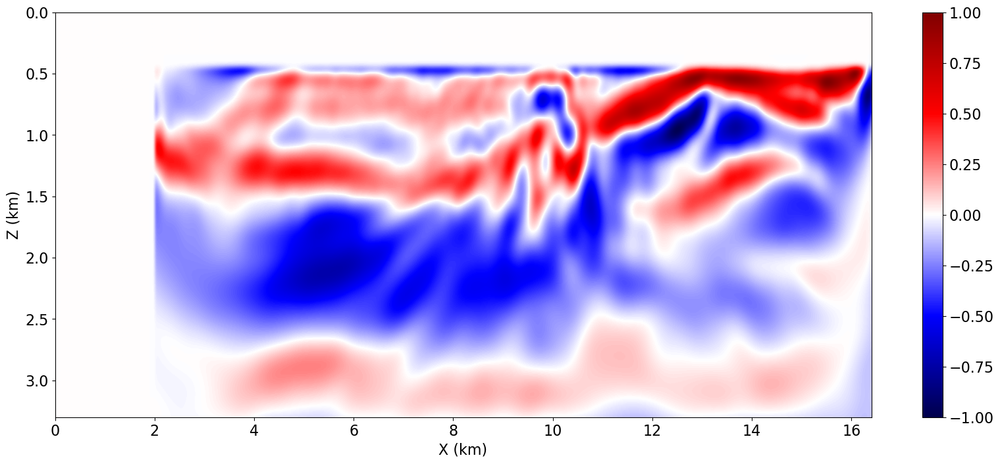

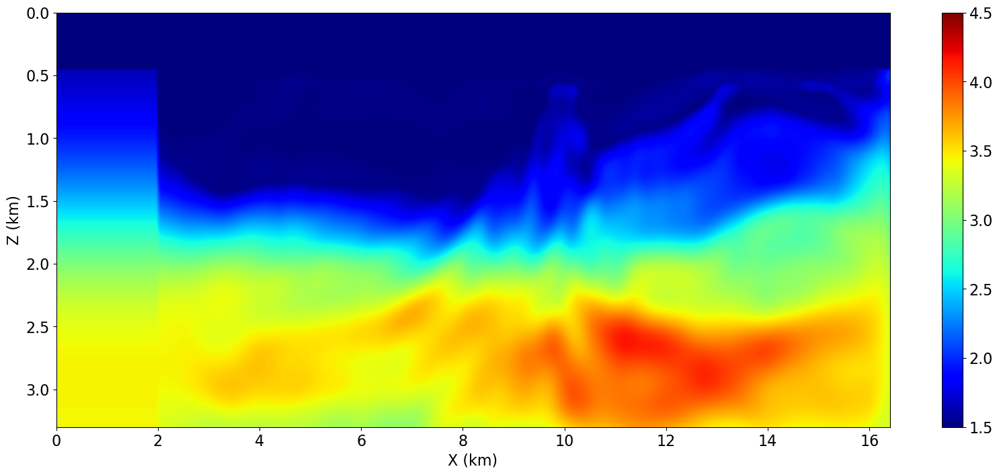

Nilai B : 1.0046993494033813
Maksimum p : 1.0
Minimum p : -0.4913627803325653
Norm P : 65.57963562011719
 
FWI freq 0.002 iterasi ke-3/9 : 5461367280538582.0
Program dimulai pada: 19:32:06
Waktu eksekusi: 1379.42 detik
ff2 = 5471622629837208.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.17731993408203126
abs(g2tp) = 5017.904296875, abs(b*gtp) = 177.31993408203127
g2tp = 5017.904296875, (b*gtp) = -177.31993408203127
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 19:55:05
Waktu eksekusi: 1332.28 detik
ff2 = 5462341111133062.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.017731993408203126
abs(g2tp) = 19249.86328125, abs(b*gtp) = 177.31993408203127
g2tp = 19249.86328125, (b*gtp) = -177.31993408203127
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 20:17:18
Waktu eksekusi: 1331.56 detik
ff2 = 5461457422072172.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.0017731993408203128
abs(g2tp) = 19868.65234

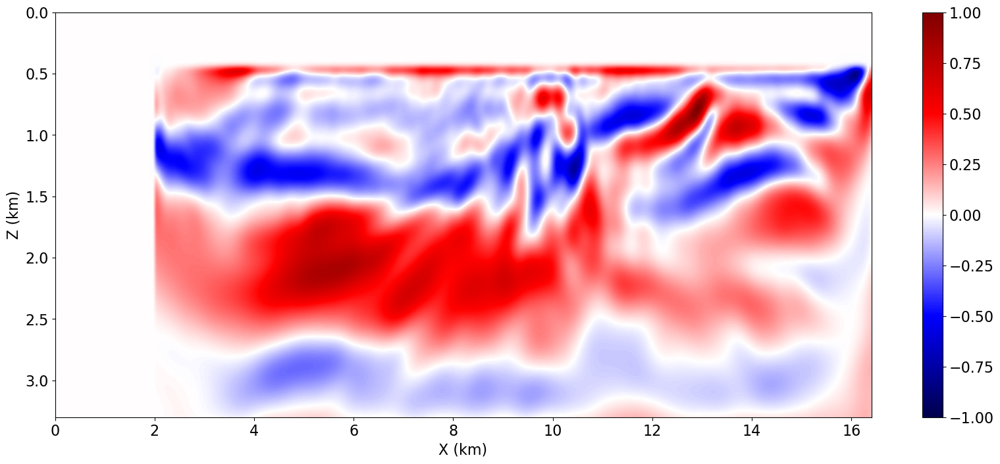

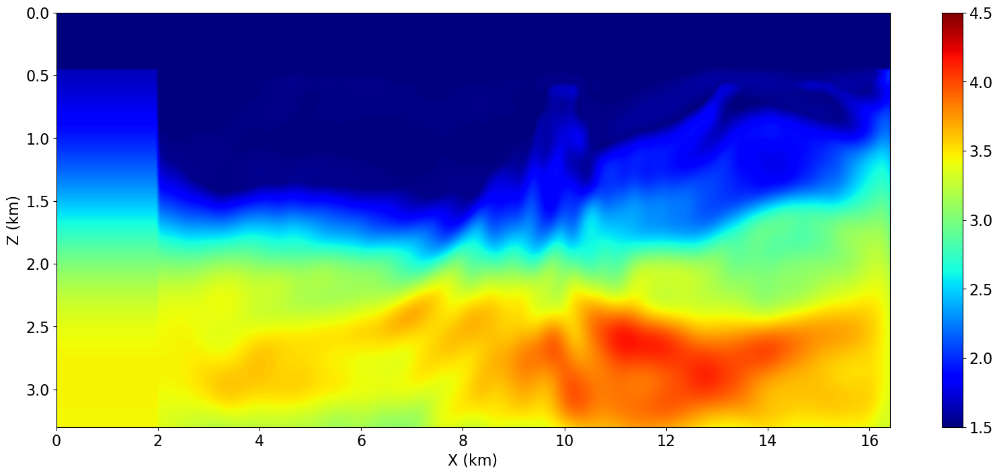

Nilai B : 1.0000160932540894
Maksimum p : 0.8458247184753418
Minimum p : -1.0
Norm P : 143.23602294921875
 
FWI freq 0.002 iterasi ke-4/9 : 5461366467521008.0
Program dimulai pada: 21:45:58
Waktu eksekusi: 1328.19 detik
ff2 = 5465526267038928.0, ff + a * l * gtp = 5461366467521006.0, a*l*gtp = -2.0079138671875003
abs(g2tp) = 5286.86083984375, abs(b*gtp) = 2007.9138671875
g2tp = 5286.86083984375, (b*gtp) = -2007.9138671875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 22:08:06
Waktu eksekusi: 1342.78 detik
ff2 = 5461061474905654.0, ff + a * l * gtp = 5461366467521008.0, a*l*gtp = -0.20079138671875002
abs(g2tp) = 22384.44921875, abs(b*gtp) = 2007.9138671875
g2tp = -22384.44921875, (b*gtp) = -2007.9138671875
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 22:30:29
Waktu eksekusi: 1325.61 detik
ff2 = 5460987649972022.0, ff + a * l * gtp = 5461366467521008.0, a*l*gtp = -0.40158277343750004
abs(g2tp) = 19471.2734375, abs(b*gtp) 

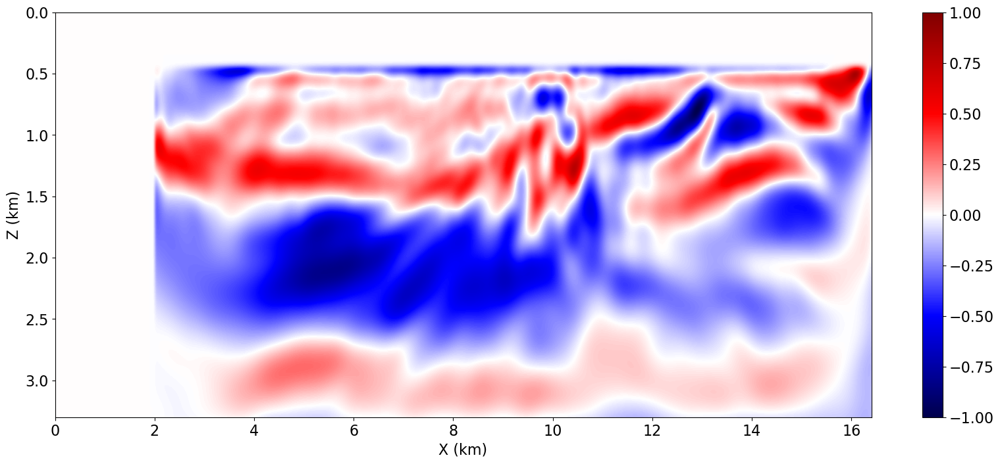

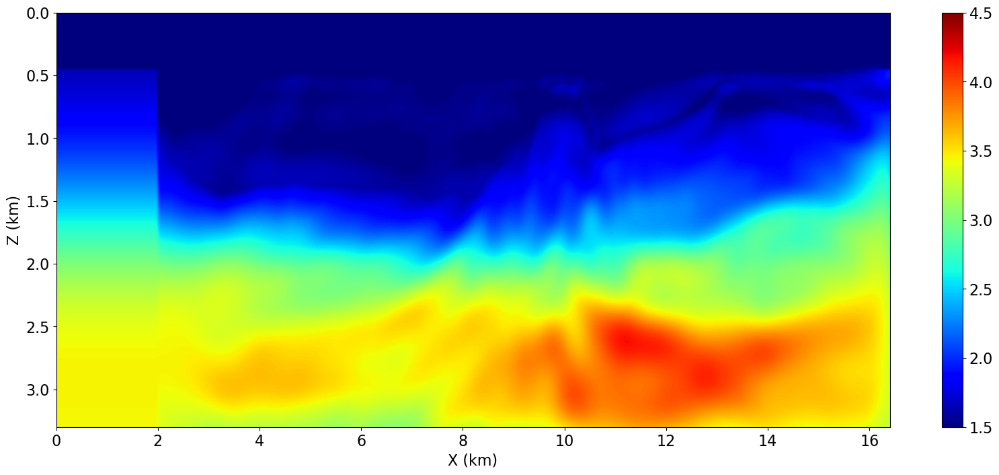

Nilai B : 1.1299091577529907
Maksimum p : 0.5992867350578308
Minimum p : -1.0
Norm P : 77.53460693359375
 
FWI freq 0.002 iterasi ke-5/9 : 5460987649972022.0
Program dimulai pada: 23:36:36
Waktu eksekusi: 1317.73 detik
ff2 = 5469559258256124.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.29949187011718753
abs(g2tp) = 6457.140625, abs(b*gtp) = 299.4918701171875
g2tp = 6457.140625, (b*gtp) = -299.4918701171875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 23:58:33
Waktu eksekusi: 1321.88 detik
ff2 = 5462044639292468.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.029949187011718753
abs(g2tp) = 19804.486328125, abs(b*gtp) = 299.4918701171875
g2tp = 19804.486328125, (b*gtp) = -299.4918701171875
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 00:20:35
Waktu eksekusi: 1316.60 detik
ff2 = 5461089984344938.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.0029949187011718754
abs(g2tp) = 24387.22265625, abs

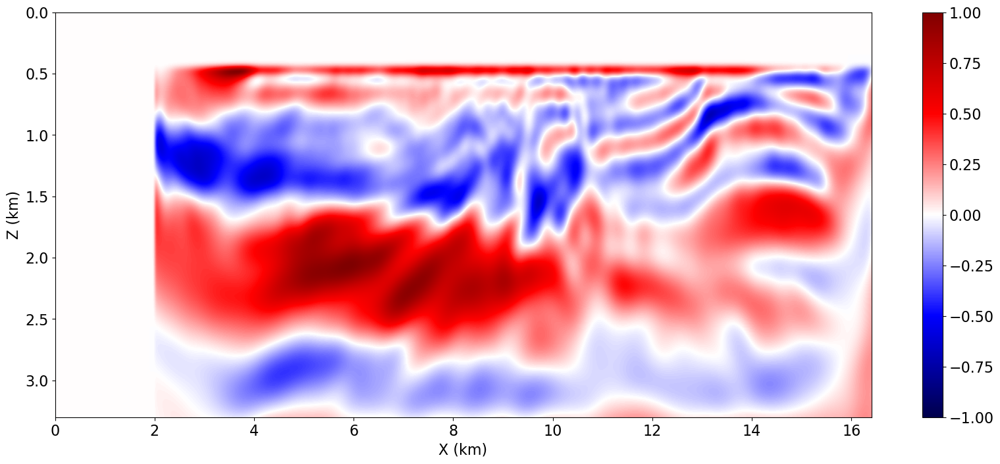

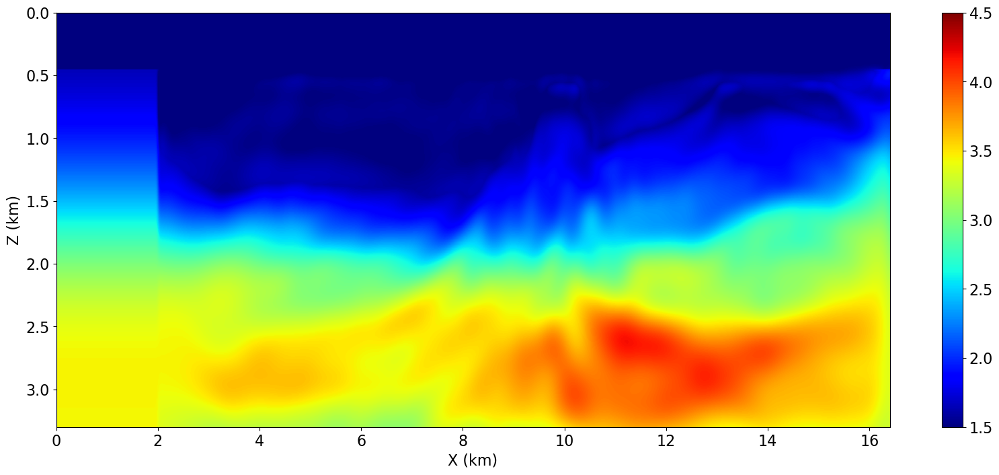

Nilai B : 1.0000003576278687
Maksimum p : 0.6994848251342773
Minimum p : -1.0
Norm P : 161.75010681152344
 
FWI freq 0.002 iterasi ke-6/9 : 5460987705771946.0
Program dimulai pada: 01:48:28
Waktu eksekusi: 1325.31 detik
ff2 = 5465281383270230.0, ff + a * l * gtp = 5460987705771943.0, a*l*gtp = -2.5217119140625
abs(g2tp) = 5063.9619140625, abs(b*gtp) = 2521.7119140625
g2tp = 5063.9619140625, (b*gtp) = -2521.7119140625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 02:10:34
Waktu eksekusi: 1328.41 detik
ff2 = 5460792808545914.0, ff + a * l * gtp = 5460987705771946.0, a*l*gtp = -0.25217119140625
abs(g2tp) = 20563.330078125, abs(b*gtp) = 2521.7119140625
g2tp = -20563.330078125, (b*gtp) = -2521.7119140625
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 02:32:43
Waktu eksekusi: 1327.73 detik
ff2 = 5460799854136628.0, ff + a * l * gtp = 5460987705771945.0, a*l*gtp = -0.5043423828125
abs(g2tp) = 14878.052734375, abs(b*gtp) = 2521.7

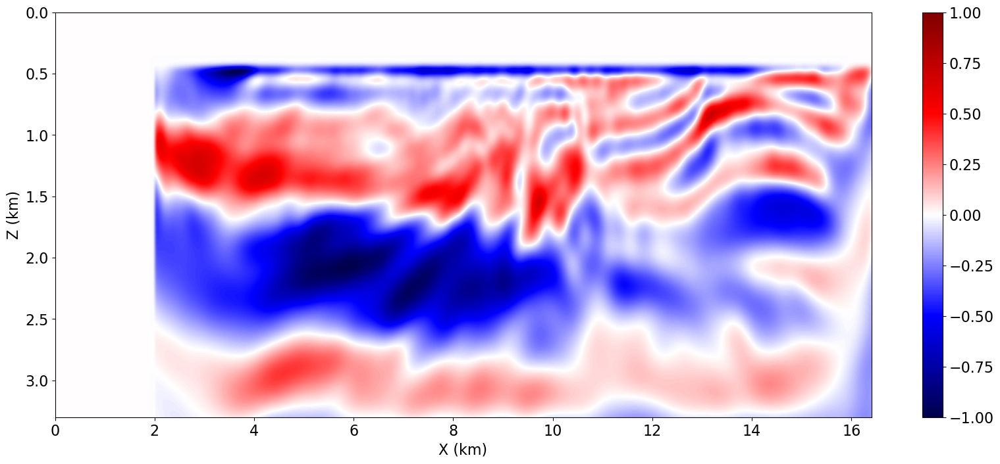

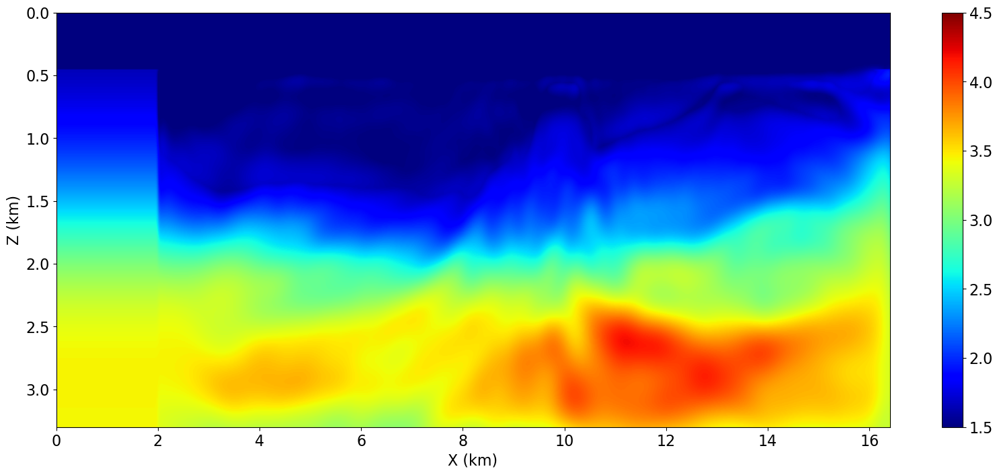

Nilai B : 0.841396689414978
Maksimum p : 1.0
Minimum p : -0.3908447027206421
Norm P : 56.042633056640625
 
FWI freq 0.002 iterasi ke-7/9 : 5460792808545914.0
Program dimulai pada: 03:39:08
Waktu eksekusi: 1320.08 detik
ff2 = 5465927352612692.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.10461099853515625
abs(g2tp) = 2894.366455078125, abs(b*gtp) = 104.61099853515626
g2tp = 2894.366455078125, (b*gtp) = -104.61099853515626
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 04:01:09
Waktu eksekusi: 1326.88 detik
ff2 = 5461670302130252.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.010461099853515626
abs(g2tp) = 14294.2421875, abs(b*gtp) = 104.61099853515626
g2tp = 14294.2421875, (b*gtp) = -104.61099853515626
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 04:23:15
Waktu eksekusi: 1323.90 detik
ff2 = 5460879178030344.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.0010461099853515626
abs(g2tp) = 17342.6

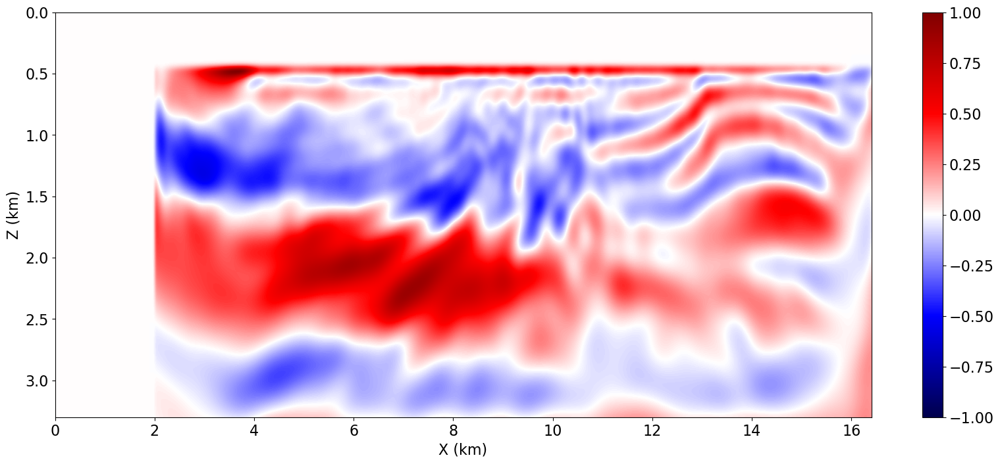

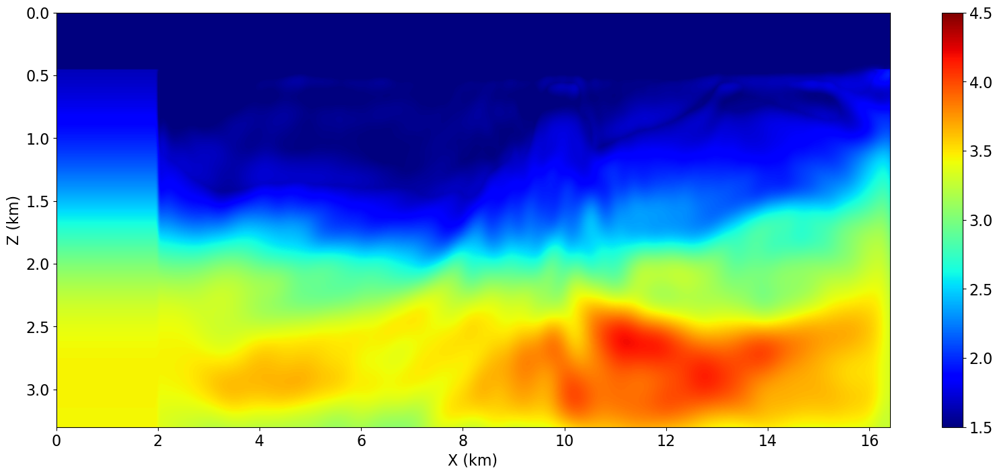

Nilai B : 0.9999727010726929
Maksimum p : 1.0
Minimum p : -0.6116902232170105
Norm P : 53.49595642089844
 
FWI freq 0.002 iterasi ke-8/9 : 5460792668992458.0
Program dimulai pada: 05:51:38
Waktu eksekusi: 1328.55 detik
ff2 = 5470100226725496.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0014499910354614258
abs(g2tp) = 3091.67236328125, abs(b*gtp) = 1.4499910354614258
g2tp = 3091.67236328125, (b*gtp) = -1.4499910354614258
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 06:13:47
Waktu eksekusi: 1335.46 detik
ff2 = 5460735491512010.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0001449991035461426
abs(g2tp) = 14419.267578125, abs(b*gtp) = 1.4499910354614258
g2tp = -14419.267578125, (b*gtp) = -1.4499910354614258
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 06:36:02
Waktu eksekusi: 1311.70 detik
ff2 = 5460752969907950.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0002899982070922852
abs(g2tp) = 10516.

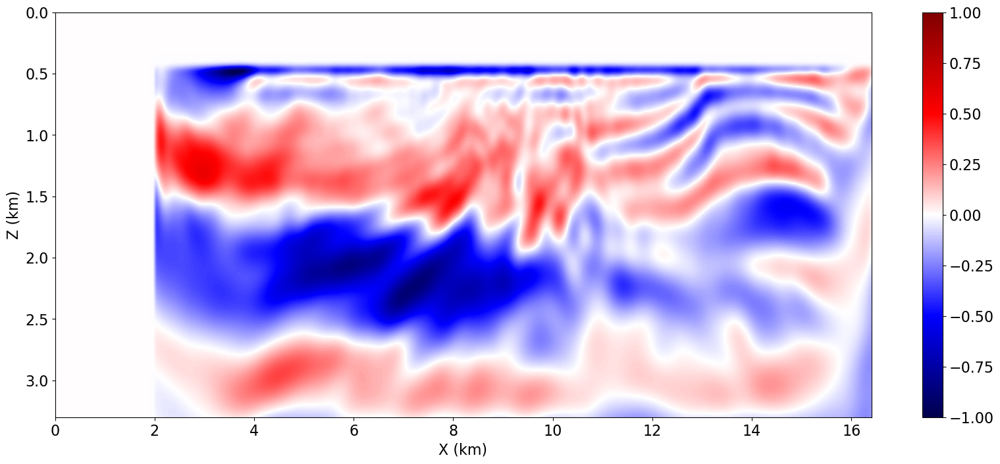

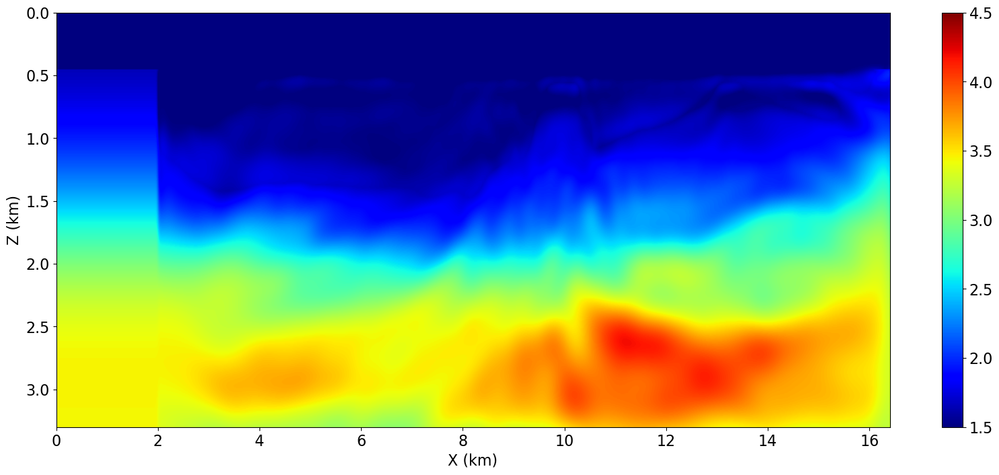

 
FWI freq 0.002 iterasi ke-9/9 : 5460735491512010.0


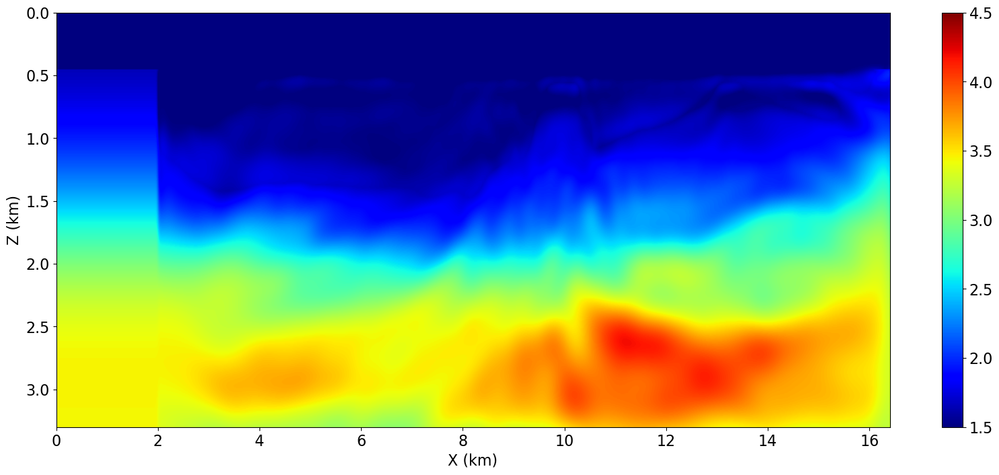

In [32]:
from copy import deepcopy
from devito import mmax, norm
import time as tm
from datetime import datetime

multiscale_freq = np.array([2.])
multiscale_freq /= 1000

modelbest_each_freq = []

misfiti = []

update_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
            space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)

#update_model.vp.data[:] = np.loadtxt("Best Model 5 Hz.txt")

xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


for k in multiscale_freq:
    print(f"Proses FWI freq {k}")

    geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, k, shift_phase)
    
    
    modeli =[]
    gradi = []
    #plot_velocity(update_model)
    model_update = deepcopy(update_model.vp.data[:])
    modeli.append(model_update)

    fwi_iterations = 9  # Number of outer FWI iteration
    fwi_index = 0
    for i in range(fwi_iterations):
        if i==0 :
            start_time = tm.time()
            

            time_start = datetime.now()
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            
            ff, update = fwi_gradient(update_model.vp)
            
            end_time = tm.time()

            print("")
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
            print("")
            

            gradient = deepcopy(update)
            gradient.data[:] *= -1

        else :
            ff, update1 = FF, G

            gradient1 = deepcopy(update1)
            gradient1.data[:] *= -1

            update = cg_hs(gradient, gradient1, update)

            if np.sum(gradient1.data[:]*update.data[:]) >= 0:
                update.data[:] = deepcopy(gradient1.data[:])
                update.data[:] *= -1
      
            gradient = deepcopy(gradient1)

        print(f"Maksimum p : {np.max(update.data)}")
        print(f"Minimum p : {np.min(update.data)}")
        print(f"Norm P : {norm(update)}")


        misfit_model = deepcopy(ff)
        misfiti.append(misfit_model)

        updatei = deepcopy(update.data[:])
        gradi.append(updatei)


        print(f" ")
        print(f"===========================================================")
        print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")
    

        L, FF, G = linesearch(update_model, ff, gradient, update, a=0.0001, b=0.1, l=1, max_iter=5, max_l = 100, scale_l=2) 

    
        update_model.vp.data[:] += ((L))*update.data[:]
        update_model.vp.data[:] = np.clip(update_model.vp.data[:], 1.5, 4.5)

        model_update = deepcopy(update_model.vp.data[:])
        modeli.append(model_update)
    
        fwi_index+=1

        plt.figure(figsize=(20, 8))
        plt.imshow(update.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()


        plt.figure(figsize=(20, 8))
        plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()
    
    ff = FF
    misfit_model = deepcopy(ff)
    misfiti.append(misfit_model)

    print(f" ")
    print(f"===========================================================")
    print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")

    best_model = deepcopy(update_model.vp.data[:])

    modelbest_each_freq.append(best_model)

    np.savetxt(f'Model_Progres/Best Model {k*1000} Hz Vp0 Rev1.txt', best_model)
    np.save(f'Model_Progres/Update Model {k*1000} Hz Vp0 Rev1.npy', modeli)
    np.save(f'Model_Progres/Gradient Model {k*1000} Hz Vp0 Rev1.npy', gradi)

    
    plt.figure(figsize=(20, 8))
    plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
    plt.colorbar()
    plt.xlabel("X (km)")
    plt.ylabel("Z (km)")
    plt.show()

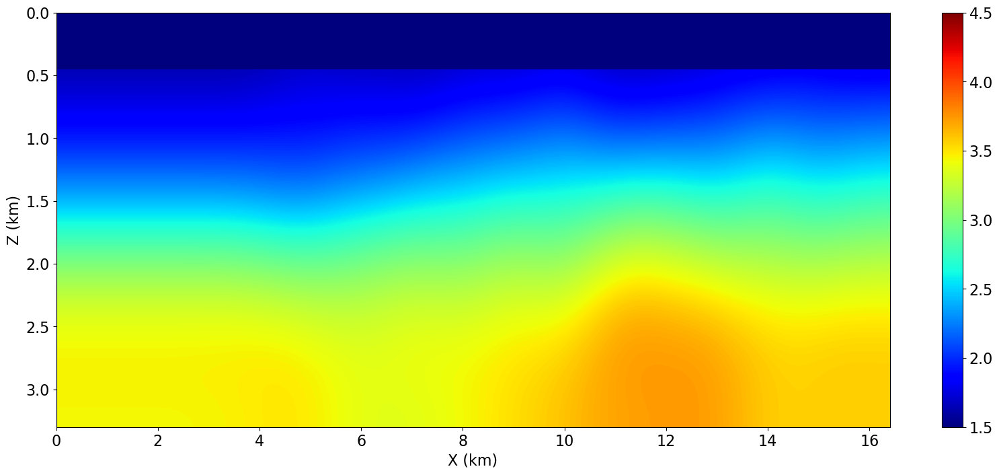

Proses FWI freq 0.013
Program dimulai pada: 10:59:53

Waktu eksekusi: 1730.16 detik

Maksimum p : 1.0
Minimum p : -0.5700048804283142
Norm P : 41.91257095336914
 
FWI freq 0.013 iterasi ke-0/9 : 1265810307150993.0
Program dimulai pada: 11:28:43
Waktu eksekusi: 1733.38 detik
ff2 = 1266572446942933.5, ff + a * l * gtp = 1265810307150992.8, a*l*gtp = -0.17538226318359376
abs(g2tp) = 159.78158569335938, abs(b*gtp) = 175.38226318359375
g2tp = 159.78158569335938, (b*gtp) = -175.38226318359375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 11:57:36
Waktu eksekusi: 1745.69 detik
ff2 = 1265597956899152.5, ff + a * l * gtp = 1265810307150993.0, a*l*gtp = -0.017538226318359378
abs(g2tp) = 1028.8858642578125, abs(b*gtp) = 175.38226318359375
g2tp = -1028.8858642578125, (b*gtp) = -175.38226318359375
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 12:26:42
Waktu eksekusi: 1734.29 detik
ff2 = 1265559832767370.0, ff + a * l * gtp = 12658103

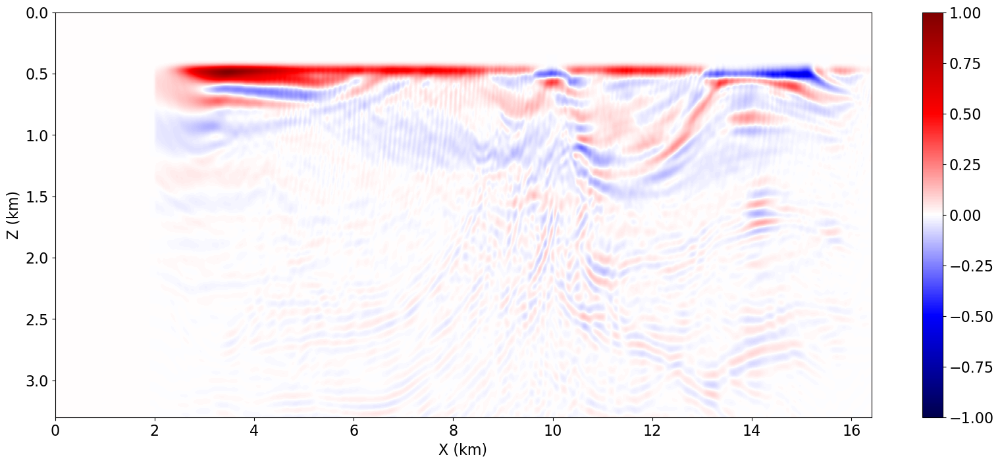

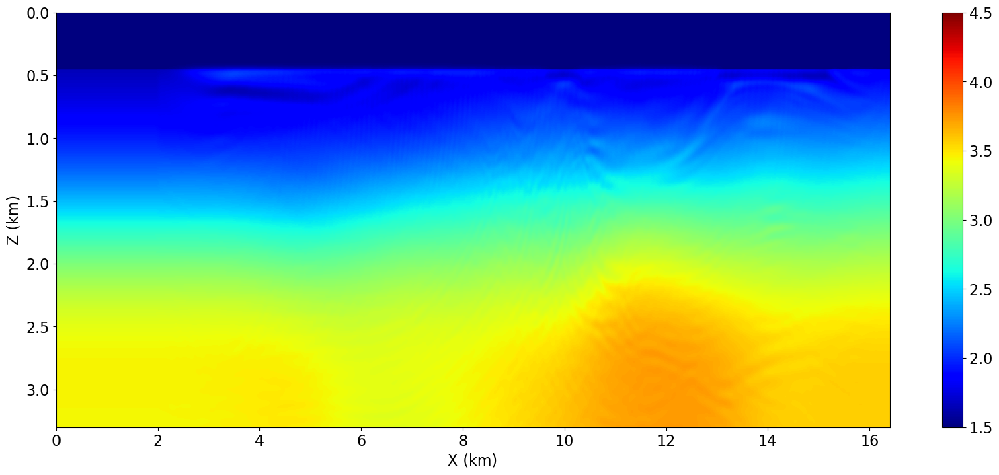

Nilai B : 0.19396013021469116
Maksimum p : 0.22080843150615692
Minimum p : -1.0
Norm P : 21.33477020263672
 
FWI freq 0.013 iterasi ke-1/9 : 1265660790856038.5
Program dimulai pada: 13:24:48
Waktu eksekusi: 1752.75 detik
ff2 = 1266280858248504.5, ff + a * l * gtp = 1265660790856038.5, a*l*gtp = -0.04158230285644531
abs(g2tp) = 73.43346405029297, abs(b*gtp) = 41.58230285644532
g2tp = 73.43346405029297, (b*gtp) = -41.58230285644532
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 13:54:01
Waktu eksekusi: 1753.95 detik
ff2 = 1265770672927289.0, ff + a * l * gtp = 1265660790856038.5, a*l*gtp = -0.004158230285644531
abs(g2tp) = 457.8749084472656, abs(b*gtp) = 41.58230285644532
g2tp = 457.8749084472656, (b*gtp) = -41.58230285644532
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 14:23:15
Waktu eksekusi: 1754.74 detik
ff2 = 1265670616008956.0, ff + a * l * gtp = 1265660790856038.5, a*l*gtp = -0.0004158230285644532
abs(g2tp) = 4

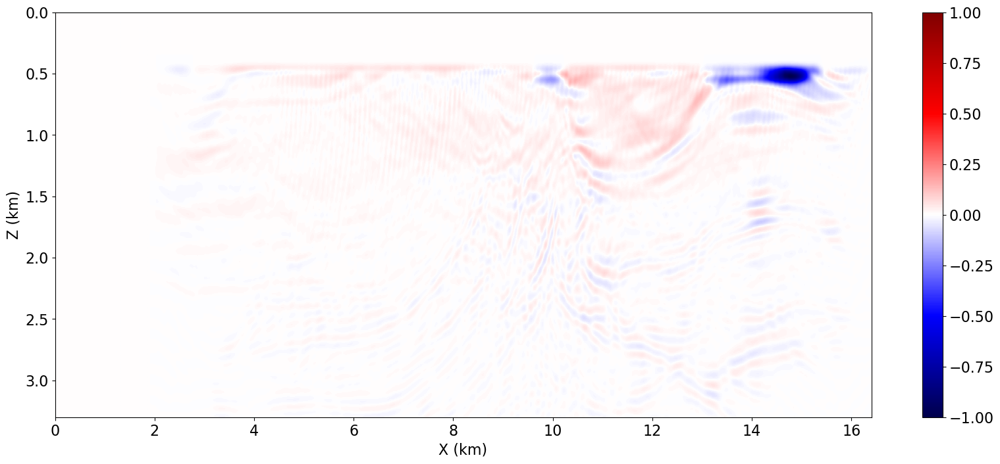

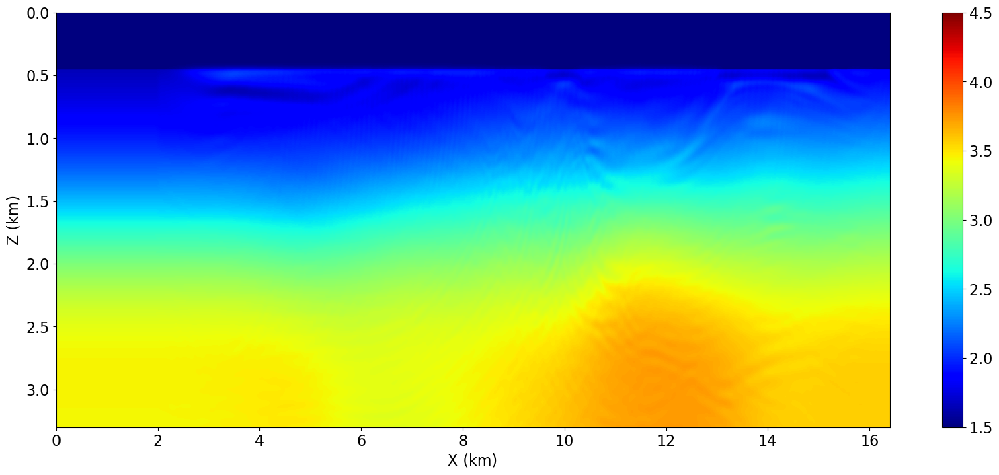

Nilai B : 0.9999954104423523
Maksimum p : 1.0
Minimum p : -0.15638162195682526
Norm P : 20.806608200073242
 
FWI freq 0.013 iterasi ke-2/9 : 1265660793101998.5
Program dimulai pada: 16:20:26
Waktu eksekusi: 1766.67 detik
ff2 = 1265781741801593.0, ff + a * l * gtp = 1265660793101998.5, a*l*gtp = -0.04319715881347656
abs(g2tp) = 101.64289093017578, abs(b*gtp) = 43.19715881347656
g2tp = 101.64289093017578, (b*gtp) = -43.19715881347656
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 16:49:52
Waktu eksekusi: 1764.45 detik
ff2 = 1265594661171256.0, ff + a * l * gtp = 1265660793101998.5, a*l*gtp = -0.004319715881347656
abs(g2tp) = 392.330322265625, abs(b*gtp) = 43.19715881347656
g2tp = -392.330322265625, (b*gtp) = -43.19715881347656
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 17:19:17
Waktu eksekusi: 1765.55 detik
ff2 = 1265600682977596.5, ff + a * l * gtp = 1265660793101998.5, a*l*gtp = -0.008639431762695313
abs(g2tp) = 200.78

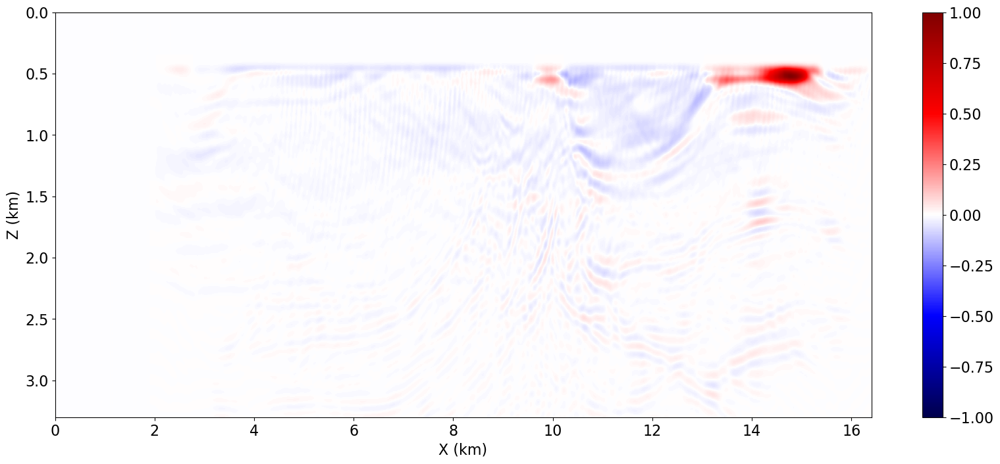

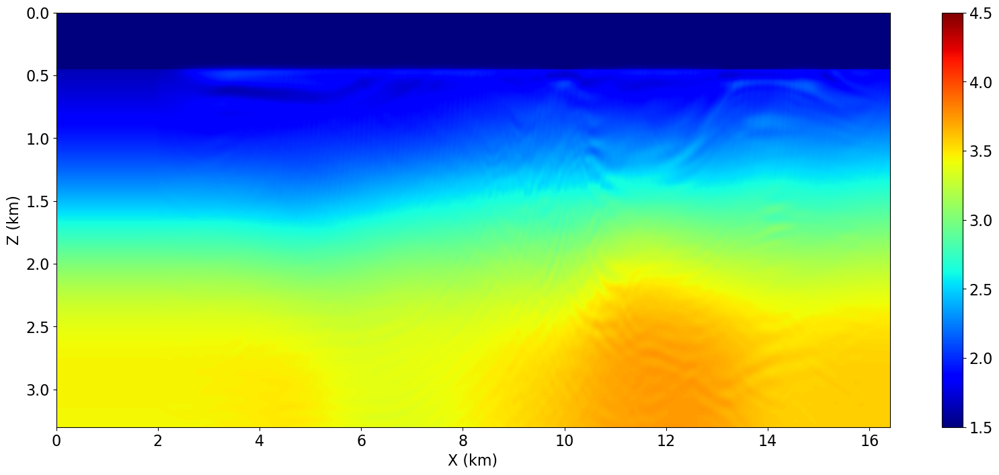

Nilai B : 1.2429536581039429
Maksimum p : 1.0
Minimum p : -0.04639671742916107
Norm P : 18.500259399414062
 
FWI freq 0.013 iterasi ke-3/9 : 1265600682977596.5
Program dimulai pada: 17:48:43
Waktu eksekusi: 1764.04 detik
ff2 = 1265845821532553.5, ff + a * l * gtp = 1265600682977596.5, a*l*gtp = -0.03354985046386719
abs(g2tp) = 87.52034759521484, abs(b*gtp) = 33.54985046386719
g2tp = 87.52034759521484, (b*gtp) = -33.54985046386719
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 18:18:07
Waktu eksekusi: 1765.16 detik
ff2 = 1265674429560614.5, ff + a * l * gtp = 1265600682977596.5, a*l*gtp = -0.003354985046386719
abs(g2tp) = 636.4877319335938, abs(b*gtp) = 33.54985046386719
g2tp = 636.4877319335938, (b*gtp) = -33.54985046386719
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 18:47:34
Waktu eksekusi: 1766.03 detik
ff2 = 1265607919976538.0, ff + a * l * gtp = 1265600682977596.5, a*l*gtp = -0.00033549850463867193
abs(g2tp) = 

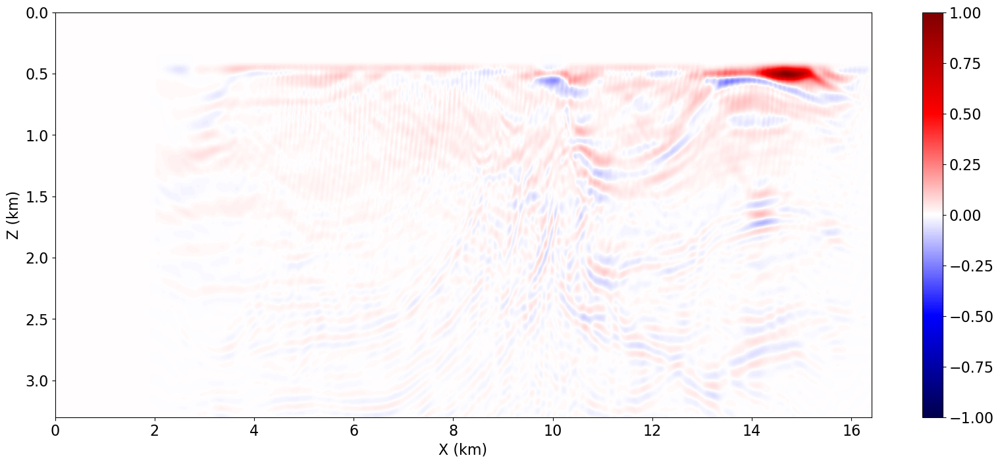

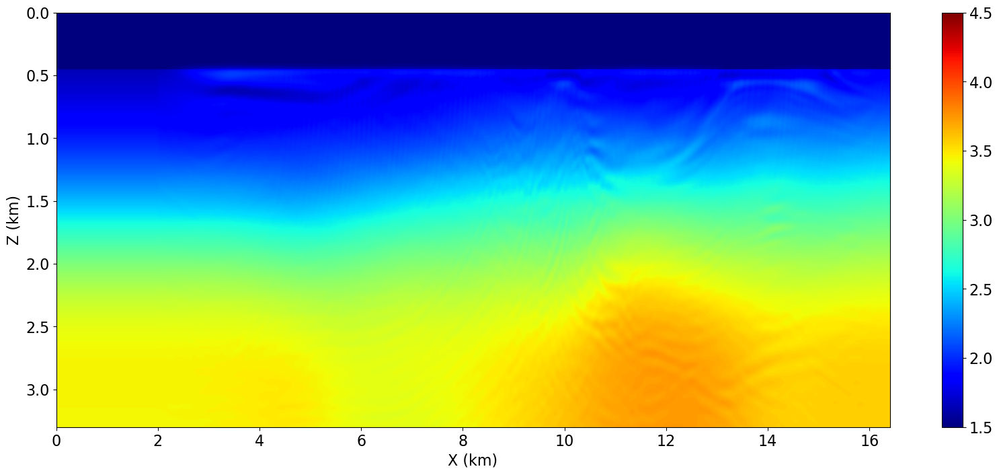

Nilai B : 1.0000122785568237
Maksimum p : 0.2723442316055298
Minimum p : -1.0
Norm P : 22.14006996154785
 
FWI freq 0.013 iterasi ke-4/9 : 1265600694215025.5
Program dimulai pada: 20:45:16
Waktu eksekusi: 1764.89 detik
ff2 = 1266136802328262.0, ff + a * l * gtp = 1265600694215025.5, a*l*gtp = -0.048815109252929687
abs(g2tp) = 41.028778076171875, abs(b*gtp) = 48.81510925292969
g2tp = -41.028778076171875, (b*gtp) = -48.81510925292969
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 21:14:41
Waktu eksekusi: 1754.57 detik
ff2 = 1265551004949698.5, ff + a * l * gtp = 1265600694215025.5, a*l*gtp = -0.004881510925292969
abs(g2tp) = 419.2698669433594, abs(b*gtp) = 48.81510925292969
g2tp = -419.2698669433594, (b*gtp) = -48.81510925292969
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 21:43:56
Waktu eksekusi: 1750.09 detik
ff2 = 1265587846064985.5, ff + a * l * gtp = 1265600694215025.5, a*l*gtp = -0.009763021850585939
abs(g2tp) = 276.

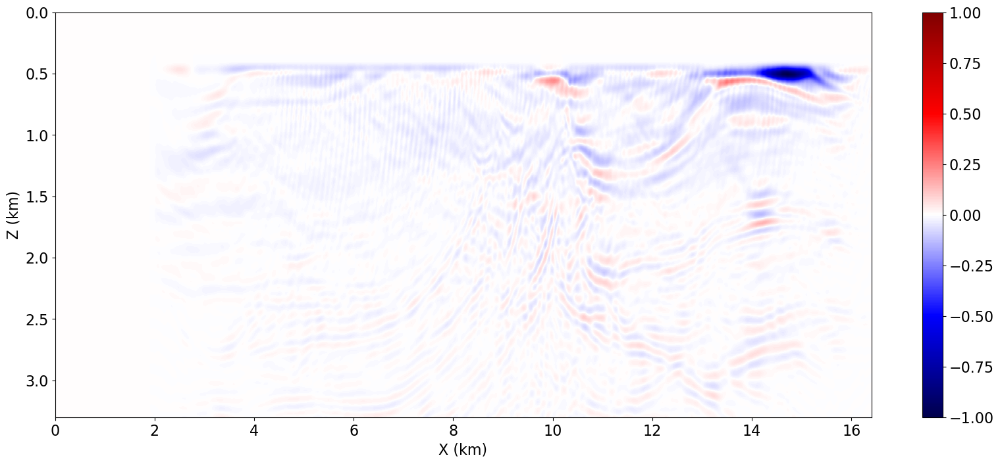

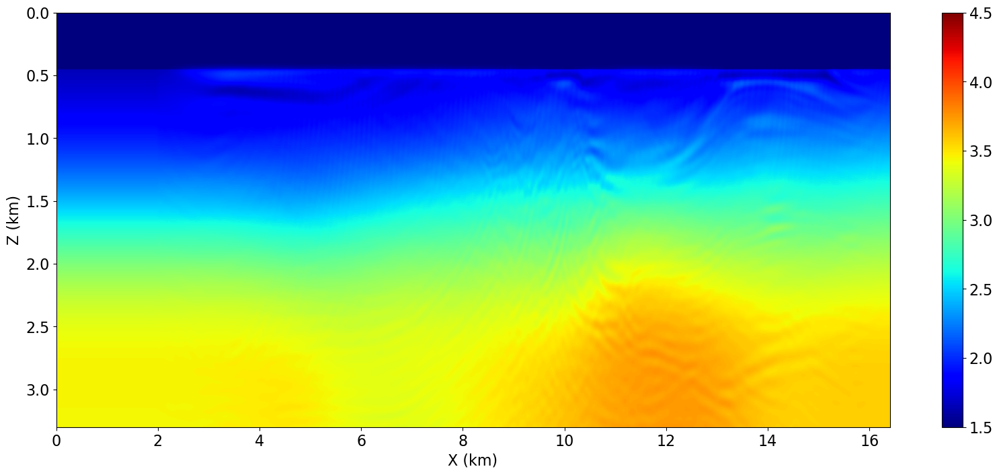

Nilai B : 0.8884723782539368
Maksimum p : 0.037807948887348175
Minimum p : -1.0
Norm P : 19.48082160949707
 
FWI freq 0.013 iterasi ke-5/9 : 1265587846064985.5
Program dimulai pada: 22:13:07
Waktu eksekusi: 1751.47 detik
ff2 = 1266058537808980.5, ff + a * l * gtp = 1265587846064985.5, a*l*gtp = -0.037763879394531255
abs(g2tp) = 63.94687271118164, abs(b*gtp) = 37.76387939453125
g2tp = -63.94687271118164, (b*gtp) = -37.76387939453125
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 22:42:18
Waktu eksekusi: 1754.52 detik
ff2 = 1265722690595685.0, ff + a * l * gtp = 1265587846064985.5, a*l*gtp = -0.0037763879394531255
abs(g2tp) = 495.3251037597656, abs(b*gtp) = 37.76387939453125
g2tp = 495.3251037597656, (b*gtp) = -37.76387939453125
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 23:11:33
Waktu eksekusi: 1744.31 detik
ff2 = 1265599444919026.0, ff + a * l * gtp = 1265587846064985.5, a*l*gtp = -0.00037763879394531256
abs(g2tp)

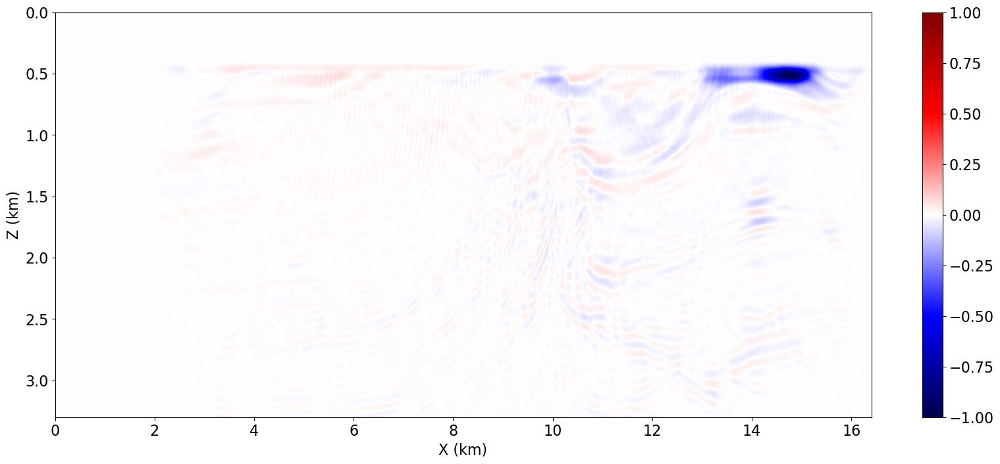

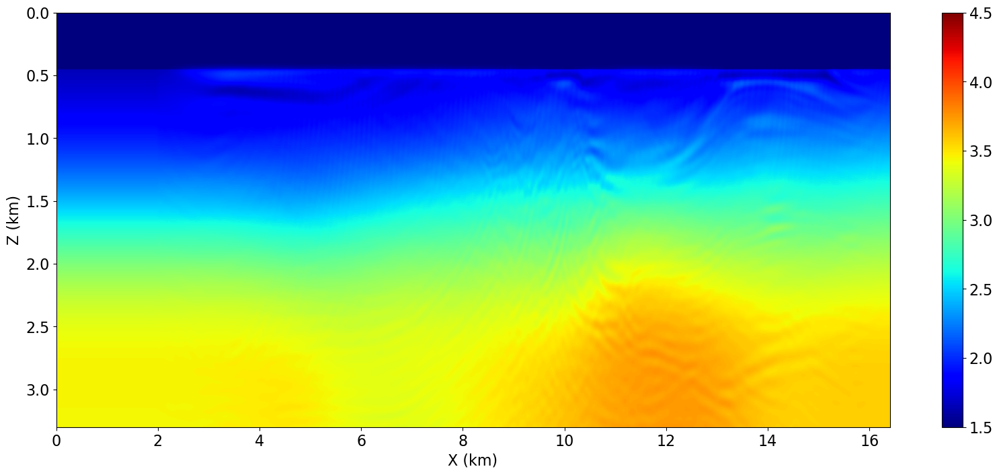

Nilai B : 0.999994695186615
Maksimum p : 1.0
Minimum p : -0.07999426126480103
Norm P : 21.56995391845703
 
FWI freq 0.013 iterasi ke-6/9 : 1265587873054281.0
Program dimulai pada: 01:08:06
Waktu eksekusi: 1759.30 detik
ff2 = 1265805691568266.5, ff + a * l * gtp = 1265587873054281.0, a*l*gtp = -0.04644937133789063
abs(g2tp) = 59.02553939819336, abs(b*gtp) = 46.449371337890625
g2tp = 59.02553939819336, (b*gtp) = -46.449371337890625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 01:37:25
Waktu eksekusi: 1757.81 detik
ff2 = 1265520693247764.5, ff + a * l * gtp = 1265587873054281.0, a*l*gtp = -0.004644937133789063
abs(g2tp) = 120.14714813232422, abs(b*gtp) = 46.449371337890625
g2tp = -120.14714813232422, (b*gtp) = -46.449371337890625
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 02:06:43


In [ ]:
from copy import deepcopy
from devito import mmax, norm
import time as tm
from datetime import datetime

multiscale_freq = np.array([13.])
multiscale_freq /= 1000

modelbest_each_freq = []


update_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
            space_order=8, nbl=nboundary, bcs="damp", grid = model0.grid)

#update_model.vp.data[:] = np.loadtxt("Model_Progres/Best Model 2.0 Hz Vp0 Rev1.txt")

xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


for k in multiscale_freq:
    print(f"Proses FWI freq {k}")

    geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, k, shift_phase)
    
    misfiti = []
    modeli =[]
    gradi = []
    #plot_velocity(update_model)
    model_update = deepcopy(update_model.vp.data[:])
    modeli.append(model_update)

    fwi_iterations = 9  # Number of outer FWI iteration
    fwi_index = 0
    for i in range(fwi_iterations):
        if i==0 :
            start_time = tm.time()
            

            time_start = datetime.now()
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            
            ff, update = fwi_gradient(update_model.vp)
            
            end_time = tm.time()

            print("")
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
            print("")
            

            gradient = deepcopy(update)
            gradient.data[:] *= -1

        else :
            ff, update1 = FF, G

            gradient1 = deepcopy(update1)
            gradient1.data[:] *= -1

            update = cg_hs(gradient, gradient1, update)

            if np.sum(gradient1.data[:]*update.data[:]) >= 0:
                update.data[:] = deepcopy(gradient1.data[:])
                update.data[:] *= -1
      
            gradient = deepcopy(gradient1)

        print(f"Maksimum p : {np.max(update.data)}")
        print(f"Minimum p : {np.min(update.data)}")
        print(f"Norm P : {norm(update)}")


        misfit_model = deepcopy(ff)
        misfiti.append(misfit_model)

        updatei = deepcopy(update.data[:])
        gradi.append(updatei)


        print(f" ")
        print(f"===========================================================")
        print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")
    

        L, FF, G = linesearch(update_model, ff, gradient, update, a=0.0001, b=0.1, l=1, max_iter=5, max_l = 100, scale_l=2) 

    
        update_model.vp.data[:] += ((L))*update.data[:]
        update_model.vp.data[:] = np.clip(update_model.vp.data[:], 1.5, 4.5)

        model_update = deepcopy(update_model.vp.data[:])
        modeli.append(model_update)
    
        fwi_index+=1

        plt.figure(figsize=(20, 8))
        plt.imshow(update.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()


        plt.figure(figsize=(20, 8))
        plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()
    
    ff = FF
    misfit_model = deepcopy(ff)
    misfiti.append(misfit_model)

    print(f" ")
    print(f"===========================================================")
    print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")

    best_model = deepcopy(update_model.vp.data[:])

    modelbest_each_freq.append(best_model)

    np.savetxt(f'Model_Progres/Best Model {k*1000} Hz Vp0 Rev1.txt', best_model)
    np.savetxt(f'Model_Progres/Misfit {k*1000} Hz Vp0 Rev1.txt', misfiti)
    np.save(f'Model_Progres/Update Model {k*1000} Hz Vp0 Rev1.npy', modeli)
    np.save(f'Model_Progres/Gradient Model {k*1000} Hz Vp0 Rev1.npy', gradi)

    
    plt.figure(figsize=(20, 8))
    plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
    plt.colorbar()
    plt.xlabel("X (km)")
    plt.ylabel("Z (km)")
    plt.show()

In [7]:
import matplotlib.pyplot as plt

misfit_freq = np.loadtxt(f'Model_Progres/Misfit Model 6.0 Hz Vp0 Rev1.txt')


plt.plot(misfit_freq)
plt.title("Graph of Misfit vs Iteration")
plt.xlabel("Iteration")
plt.ylabel("Misfit")
plt.show()

FileNotFoundError: Model_Progres/Misfit Model 6.0 Hz Vp0 Rev1.txt not found.

(9, 1472, 424)


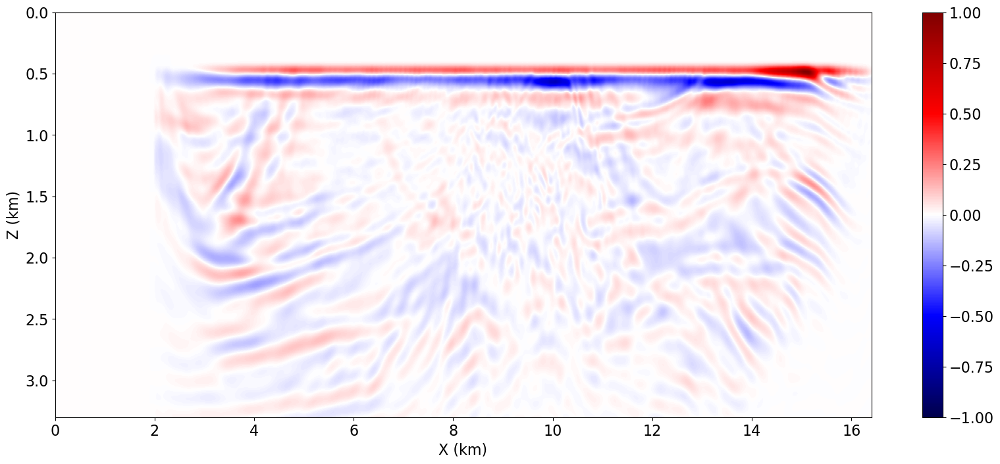

In [80]:
import numpy as np
from copy import deepcopy

grad_cek = Function(name="grad_cek", grid=model0.grid)

# Load file .npy
Gradient_check = np.load('Model_Progres/Gradient Model 6.0 Hz Vp0 Rev1.npy')

# Cek hasilnya
print(Gradient_check.shape)


Gradient_Dummy = deepcopy(grad_cek)
Gradient_Dummy.data[:] = Gradient_check[0]
#Gradient_Dummy.data[:] /= np.linalg.norm((Gradient_Dummy.data[:]))


xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(Gradient_Dummy.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', aspect='auto', vmin=-1, vmax=1)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


(1472, 424)


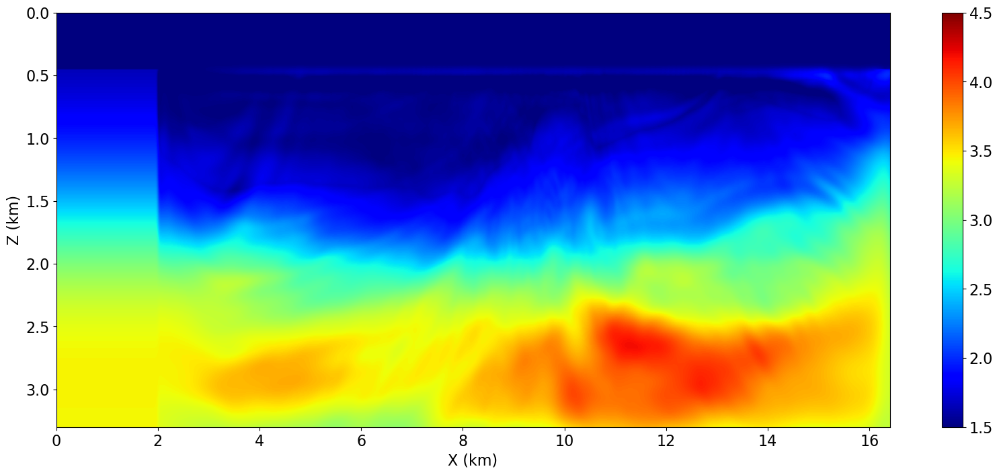

In [104]:
import numpy as np
from copy import deepcopy

model_cek = deepcopy(model0)

# Load file .npy
model_cek.vp.data[:] = np.loadtxt('Model_Progres/Best Model 6.0 Hz Vp0 Rev1.txt')

# Cek hasilnya
print(model_cek.vp.shape)




xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(model_cek.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto', vmin = 1.5, vmax=4.5)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

(10, 1472, 424)


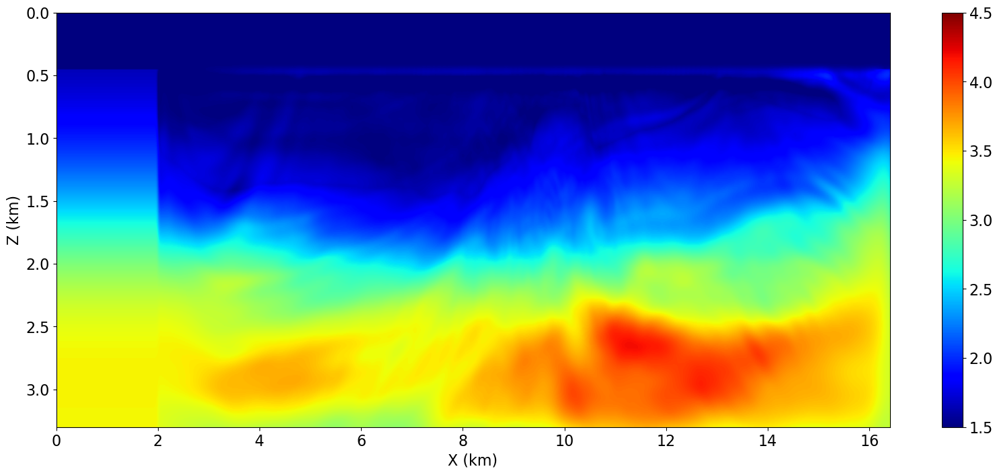

In [103]:
import numpy as np
from copy import deepcopy


model_cek = deepcopy(model0)

# Load file .npy
model_cek_i = np.load('Model_Progres/Update Model 6.0 Hz Vp0 Rev1.npy')
print(model_cek_i.shape)


model_cek.vp.data[:] = model_cek_i[1]

# Cek hasilnya



xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(model_cek.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto', vmin = 1.5, vmax=4.5)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

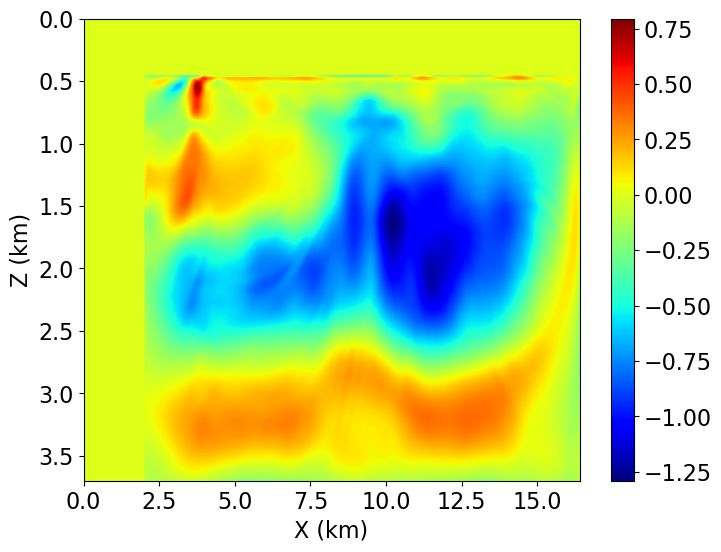

In [36]:
selisih_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
              space_order=2, nbl=nboundary, bcs="damp", grid = model.grid)
selisih_model.vp.data[:] = update_model.vp.data[:] - model0.vp.data[:]
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.imshow(selisih_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

In [41]:
geometrys[124].src_positions
geometrys[0].rec_positions[0]

array([0., 0.])

In [43]:
recs_coordinate = []

for i in range(nshots):
    recs_coordinate.append(geometrys[i].rec_positions)

In [44]:
recs_coordinate[0]

array([[   0.        ,    0.        ],
       [  25.47169811,    0.        ],
       [  50.94339623,    0.        ],
       [  76.41509434,    0.        ],
       [ 101.88679245,    0.        ],
       [ 127.35849057,    0.        ],
       [ 152.83018868,    0.        ],
       [ 178.30188679,    0.        ],
       [ 203.77358491,    0.        ],
       [ 229.24528302,    0.        ],
       [ 254.71698113,    0.        ],
       [ 280.18867925,    0.        ],
       [ 305.66037736,    0.        ],
       [ 331.13207547,    0.        ],
       [ 356.60377358,    0.        ],
       [ 382.0754717 ,    0.        ],
       [ 407.54716981,    0.        ],
       [ 433.01886792,    0.        ],
       [ 458.49056604,    0.        ],
       [ 483.96226415,    0.        ],
       [ 509.43396226,    0.        ],
       [ 534.90566038,    0.        ],
       [ 560.37735849,    0.        ],
       [ 585.8490566 ,    0.        ],
       [ 611.32075472,    0.        ],
       [ 636.79245283,   

In [50]:
recs_coordinate = np.array(recs_coordinate)
srcs_coordinate = np.array(geometrys[0].src_positions)

In [47]:
recs_coordinate.shape

(125, 160, 2)

In [51]:
import matplotlib.pyplot as plt

# Misalnya bentuk array kamu:
# receiver_coords shape: (nshot, nreceiver, 2)
# source_coords shape: (nshot, 2)

def plot_shot_gather(receiver_coords, source_coords, shot_idx):
    # Ambil koordinat untuk satu shot
    recs = receiver_coords[shot_idx]  # shape: (nreceiver, 2)
    src = source_coords[shot_idx]     # shape: (2,)

    plt.figure(figsize=(10, 5))
    plt.scatter(recs[:, 0], recs[:, 1], c='blue', label='Receiver', marker='v')
    plt.scatter(src[0], src[1], c='red', label='Source', marker='*', s=100)
    plt.title(f'Shot {shot_idx}')
    plt.xlabel('X')
    plt.ylabel('Z')
    plt.gca().invert_yaxis()  # karena Z biasanya ke bawah dalam data seismik
    plt.legend()
    plt.grid(True)
    plt.show()


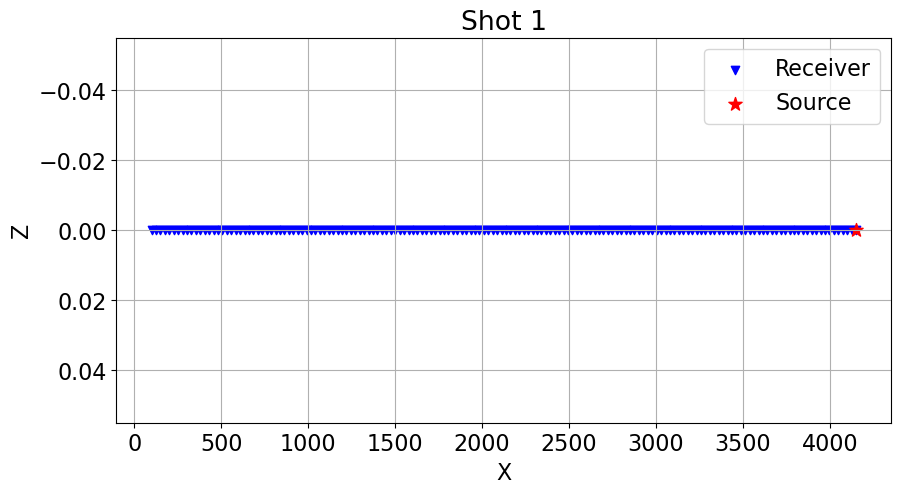

In [52]:
plot_shot_gather(recs_coordinate, srcs_coordinate, 1)

In [53]:
import matplotlib.pyplot as plt

def plot_all_shots(receiver_coords, source_coords):
    nshot = source_coords.shape[0]

    plt.figure(figsize=(12, 6))

    for shot in range(nshot):
        recs_x = receiver_coords[shot, :, 0]  # ambil hanya x receiver
        shot_num = [shot] * len(recs_x)       # y-nya: nomor shot yang sama

        # plot receiver
        plt.scatter(recs_x, shot_num, color='blue', s=5, label='Receiver' if shot == 0 else "")

        # plot source
        plt.scatter(source_coords[shot, 0], shot, color='red', marker='*', s=30, label='Source' if shot == 0 else "")

    plt.xlabel('X Coordinate')
    plt.ylabel('Shot Number')
    plt.title('Source & Receiver Coordinates per Shot')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


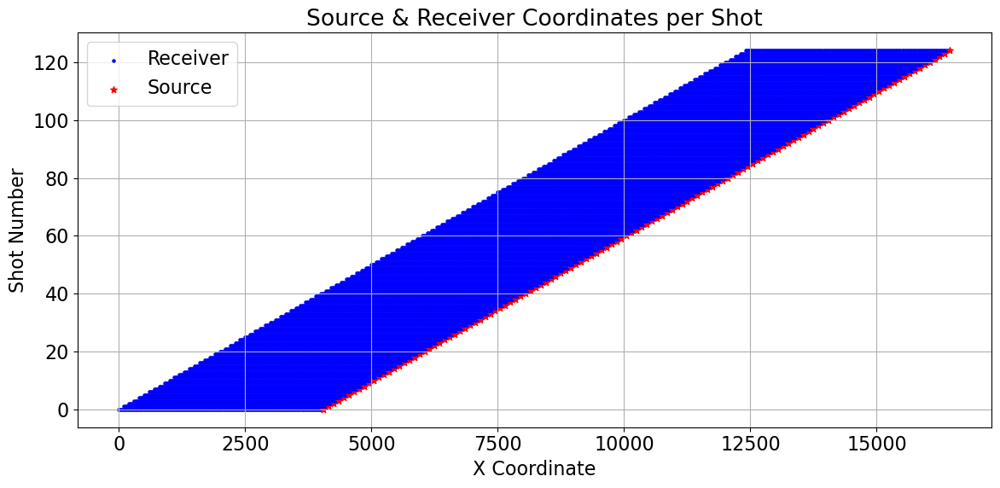

In [54]:
plot_all_shots(recs_coordinate, srcs_coordinate)

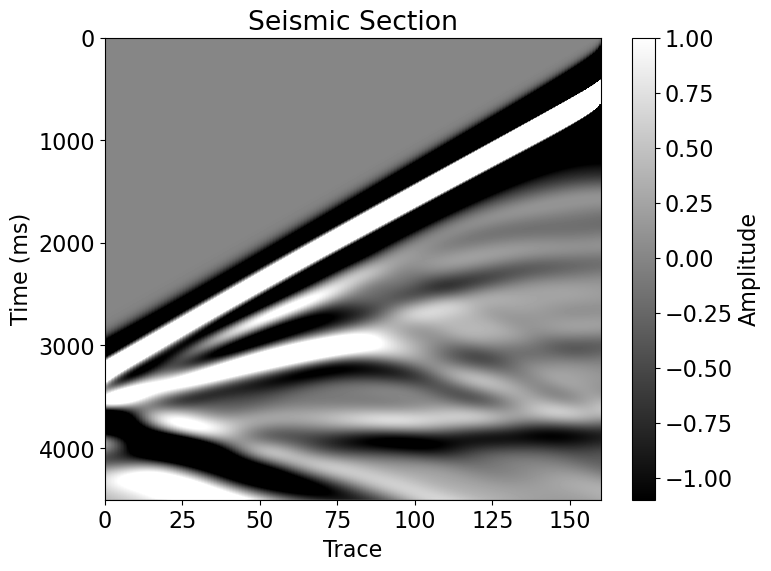

In [48]:
from examples.seismic.acoustic import AcousticWaveSolver

solver = AcousticWaveSolver(model1, geometrys[0], space_order=4)

d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[0].time_axis, 
                         coordinates=geometrys[0].rec_positions)

_, _, _ = solver.forward(vp=update_model.vp, src=srcs[0], rec=d_obs)

plt.imshow(d_obs.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmax=-1, vmin=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

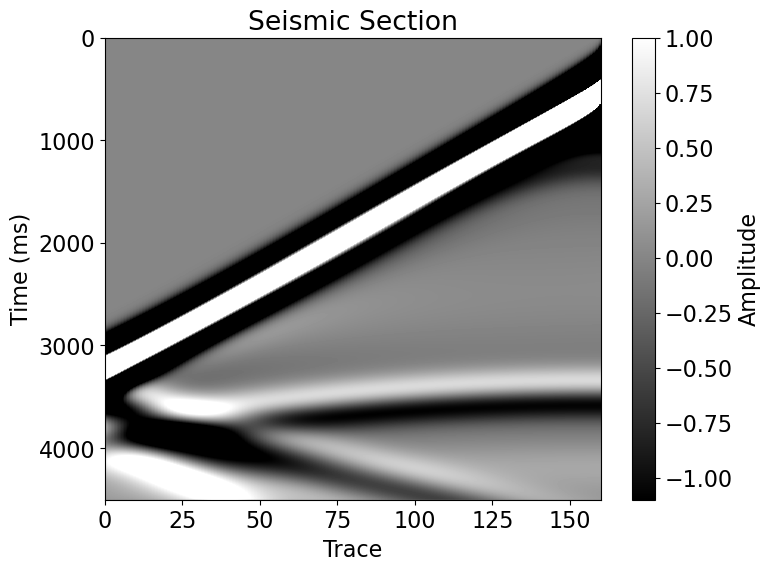

In [47]:
from examples.seismic.acoustic import AcousticWaveSolver

solver = AcousticWaveSolver(model1, geometrys[0], space_order=4)

d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[0].time_axis, 
                         coordinates=geometrys[0].rec_positions)

_, _, _ = solver.forward(vp=model0.vp, src=srcs[0], rec=d_obs)

plt.imshow(d_obs.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmax=-1, vmin=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()